In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

In [2]:
df = pd.read_csv('spotify-2023.csv', encoding='ISO-8859-1')

In [3]:
def clean_categorical_data(df):
    # Select only the categorical columns
    cat_columns = df.select_dtypes(['object']).columns

    # Clean the categorical columns
    for col in cat_columns:
        # Strip white spaces
        df[col] = df[col].str.strip()
        # Convert to lowercase
        df[col] = df[col].str.lower()
        # Remove special characters but keep spaces
        df[col] = df[col].str.replace('[^a-zA-Z0-9\s#]', '', regex=True)
    return df

In [4]:
def clean_numeric_data(data, col_name):
    # Retain only the numeric parts of the string
    data[col_name] = data[col_name].astype(str).str.extract('(\d+)', expand=False)
    
    # Convert cleaned strings to numbers
    data[col_name] = pd.to_numeric(data[col_name], errors='coerce')

In [5]:
def draw_categorical_plot(data, figsize=(8, 6), colors=None):
    
    if not isinstance(data, pd.Series):
        raise ValueError("Input data should be a categorical data.")
    
    # Count the occurrences of each category in the data
    counts = data.value_counts()
    
    # Create a figure and axes
    fig, ax = plt.subplots(figsize=figsize)
    
    # If there are less than 6 unique observations, draw a pie chart
    if len(counts) <= 5:
        counts.plot(kind='pie', autopct='%1.1f%%', colors=colors, ax=ax)
        ax.set_title("Pie Chart of " + data.name)
        ax.set_ylabel("")  # This is to remove the column name from the side of the pie chart
    else:
        # Otherwise, draw a bar chart
        sns.barplot(x=counts.index, y=counts.values, palette=colors, ax=ax)
        ax.set_title("Bar Chart of " + data.name)
        ax.set_ylabel("Count")
    
    plt.tight_layout()
    plt.show()  # Display the plot

In [6]:
# For Numeric data
def draw_numeric_plot(data):
    
    num_unique = data.nunique()
    
    if num_unique == 2:
        # Donut chart
        plt.figure(figsize=(8, 6))
        # Extract the value counts and labels
        counts = data.value_counts()
        labels = counts.index

        # Plot
        wedges, texts, autotexts = plt.pie(counts, labels=labels, wedgeprops=dict(width=0.4), 
                                           autopct='%1.1f%%', startangle=140, pctdistance=0.85)
    
        # Draw center circle for 'donut' style
        centre_circle = plt.Circle((0,0),0.70,fc='white')
        plt.gca().add_artist(centre_circle)

        # Improve text visibility
        for text, autotext in zip(texts, autotexts):
            text.set(size=12)
            autotext.set(size=12)

        plt.title(f"Donut Chart of {data.name}")
        plt.ylabel("")  # Remove automatic label
        plt.legend(loc="best")  # Display a legend
    
    elif 3 <= num_unique <= 50:
        # Bar chart
        plt.figure(figsize=(12, 6))
        data.value_counts().sort_index().plot(kind='bar', color='skyblue')
        plt.title(f"Bar Chart for {data.name}")
        plt.ylabel("Frequency")
        plt.xlabel(data.name)
    
    elif 51 <= num_unique < 90:
        # Simple histogram
        plt.figure(figsize=(12, 6))
        plt.hist(data, bins=30, edgecolor='black', color='skyblue')
        plt.title(f"Histogram of {data.name}")
        plt.ylabel("Frequency")
        plt.xlabel(data.name)
    
    elif num_unique >= 90:
        # Histogram and boxplot
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        
        ax[0].hist(data, bins=30, edgecolor='black', color='skyblue')
        ax[0].set_title(f"Histogram of {data.name}")
        ax[0].set_ylabel("Frequency")
        ax[0].set_xlabel(data.name)
        
        ax[1].boxplot(data, vert=False)
        ax[1].set_title(f"Boxplot of {data.name}")
        ax[1].set_yticklabels([data.name])
    
    plt.tight_layout()
    plt.show()

In [7]:
def generate_mock_dataframe(rows=100, column_name='acousticness'):
    ranks = ['top 10', 'top 50', 'top 100', 'top 250', 'top 500', 'beyond 500']
    return pd.DataFrame({
        column_name: np.random.rand(rows),
        'track_Rank': np.random.choice(ranks, size=rows)
    })

def plot_column_distribution(dataframes, column_name):
    labels = ['top 10', 'top 50', 'top 100', 'top 250', 'top 500', 'beyond 500']
    stats = ['min', 'max', 'mean', 'std']

    results = {stat: {label: [] for label in labels} for stat in stats}

    for label in labels:
        for stat in stats:
            results[stat][label].append(
                np.mean([df[df['track_Rank'] == label][column_name].agg(stat) for df in dataframes])
            )

    plt.figure(figsize=(12, 6))
    colors = {'min': 'lightgreen', 'max': 'lightcoral', 'mean': 'skyblue', 'std': 'gold'}

    for stat in stats:
        plt.plot(labels, results[stat].values(), marker='o', linestyle='-', color=colors[stat], label=f'{column_name} {stat.capitalize()}')

    plt.xlabel('Track Rank')
    plt.ylabel(column_name.capitalize())
    plt.title(f'Distribution of {column_name} per Track Rank')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [8]:
def time_line_analysis(df, column_name):    
    # Count the occurrences of each unique value in the column
    data_counts = df[column_name].value_counts().sort_index()

    plt.figure(figsize=(12, 6))
    plt.plot(data_counts.index, data_counts.values, marker='o', linestyle='-')
    
    plt.title(f"Line Chart for {column_name}")
    plt.ylabel("Frequency")
    plt.xlabel(column_name)
    
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

![Spotify Logo](https://logos-world.net/wp-content/uploads/2020/09/Spotify-Emblem.png)

# Most Streamed Spotify Songs 2023

---

### Table of Contents
- **Executive summary**
- **Data Wrangling**
- **Categorical Data**
    - Key feature
    - Mode feature
- **Numerical Data**
    - Platform Performances
    - Music Properties
    - Time Series
    - Correlation Matrix
    - Pairplot vs. Independent Variables
- **Data Preprocessing**
    - Methodology
    - Feature Scaling
- **Classfication ML Model**
    - Confusion Matrix
    - Precision Recall Curve
    - Receiver Operating Characteristic Curve
    - Cross Validation (K-Fold)
---

## Executive Summary

###### Welcome to the Most Streamed Spotify Songs 2023 Project!

In the digital age of music, platforms like Spotify have risen to prominence, shaping the landscape of music consumption, discovery, and monetization. Our analysis derives from an extensive dataset, one that offers more than a mere list of the most acclaimed songs of 2023 on Spotify. Beyond chart rankings, this dataset illuminates various facets of each song: its intrinsic musical attributes, its popularity metrics across different platforms, and its larger footprint in the digital music ecosystem.

The data not only details track and artist names or release dates but also ventures into the song's presence across multiple platforms. From Spotify's own playlists and charts to its streaming statistics, the dataset casts a wide net. Additionally, it delves into each track's standing on platforms like Apple Music and Deezer, and even its ranking on Shazam charts.

Such a multifaceted dataset provides us with a holistic view of a song's journey, from its initial release to its peak popularity, and its resonance across different platforms. This analysis is pivotal for stakeholders in the music industry, from artists to record labels, to understand trends, audience preferences, and the competitive landscape in 2023's music streaming world.

Data source was obtained from [Kaggle](https://www.kaggle.com/datasets/nelgiriyewithana/top-spotify-songs-2023)

---

### Dataset Overview:

This dataset offers a rich tapestry of information on songs and their performances across major music platforms. Here's a condensed summary:

1. **track_name**: Denoting the song title, it covers 942 distinct tracks.
2. **artist(s)_name**: A list of the 645 unique artists featured.
3. **artist_count** & **track_type**: While `artist_count` quantifies artists on a track (ranging from 1 to 8), `track_type` classifies tracks as either 'solo' or 'collaboration' based on this count.
4. **release_date**: Provides the track's release date, further segmented into:
    - **released_year**: Over a span of 50 years.
    - **released_month**: Covering all 12 months.
    - **released_day**: Including dates from 1 to 31.
5. **Platform Performances**: Metrics showing song presence across platforms:
    - Spotify: via `in_spotify_playlists` and `in_spotify_charts`.
    - Apple Music: through `in_apple_playlists` and `in_apple_charts`.
    - Deezer: represented by `in_deezer_playlists` and `in_deezer_charts`.
    - Shazam: using `in_shazam_charts` with 191 unique values.
6. **streams**: Tallying streams across platforms, it holds 949 unique counts.
7. **Music Properties**: Dive into song characteristics:
    - **bpm**: Beats per minute with 124 distinct values.
    - **key**: Holding 11 different musical keys.
    - Features like `mode`, `danceability_%`, `valence_%`, `energy_%`, `acousticness_%`, `instrumentalness_%`, `liveness_%`, and `speechiness_%` describe other song attributes.
8. **Custom Ranks**:
    - **artist_Rank** & **track_Rank**: Custom rankings classifying artists and tracks based on criteria, labeled as ['top 10', 'top 50', 'top 100', 'top 250', 'top 500', 'beyond 500'].

This dataset is a window into 2023's music landscape, spotlighting song features and performances across top music platforms.

With this dataset, our aim is to understand music trends, artist performances, and the potential predictors of a song's success across different music streaming platforms. Let's dive into the data and uncover the insights!

#### Independent Variable: Mode

The **mode** of a song refers to its musical modality, which typically describes the track's overall mood. In Western music theory, there are primarily two modes: Major and Minor. Major mode is often associated with a brighter, happier sound, while Minor mode tends to sound sadder or more somber. 

Given the impact of a song's mood on listener preferences and streaming behavior, the `mode` serves as our independent variable. Throughout this analysis, we'll explore how the modality of tracks correlates with their performance metrics, streaming counts, and presence in various platform charts. 

**Objectives of the study**
* Does a song's modality predict its success? 
* Are Major tracks more prevalent in upbeat playlists? 
* Do Minor tracks dominate somber or introspective playlists? 


These are among the many questions we'll aim to answer as we delve deeper into the Spotify 2023 dataset.


**Analyst: Ola76**

---
## 0. Data Wrangling

Before delving into in-depth analysis, it's crucial to preprocess and clean the data to ensure its integrity and reliability. Here's a concise overview of the data wrangling steps undertaken:

* **Handling Missing Data**: 
    - The `key` feature, which had some missing entries, was addressed by replacing the missing values with the mode (most frequently occurring value) of the column. This approach ensures that we maintain the most common musical key trend in the dataset.
    - On the other hand, for the `in_shazam_charts` feature, the missing values were filled with the mean (average) of existing values. This strategy was chosen to preserve the overall distribution and trend of the feature.

* **Type Conversion**: 
    - Several columns, initially categorized as object data types, were converted to more appropriate numerical data types. For instance, features like `streams` and `in_deezer_playlists` were transformed to `int64`, while `in_shazam_charts` was converted to `float64`.

These data wrangling steps are pivotal, setting the foundation for a reliable and insightful analysis. They ensure that our dataset is primed and ready for both statistical examination and meaningful visualizations.

---

In [9]:
pd.set_option('display.max_columns', None)
df.head()

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,147,141381703,43,263,45,10,826,125,B,Major,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,126,58,14,382,92,C#,Major,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,207,91,14,949,138,F,Major,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,207,125,12,548,170,A,Major,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,133,87,15,425,144,A,Minor,65,23,80,14,63,11,6


In [10]:
# Calculate the number of missing values for each feature
missing_values = df.isnull().sum()

# Filter out features without missing values
missing_values = missing_values[missing_values > 0]

# Display missing values
if not missing_values.empty:
    print("Number of missing values for each feature:")
    print(missing_values)
else:
    print("No missing values detected in the dataset!")

Number of missing values for each feature:
in_shazam_charts    50
key                 95
dtype: int64


In [ ]:
def check_duplicates(data):
    duplicate_rows = df[df.duplicated()]

    if not duplicate_rows.empty:
        print("Total duplicate rows:", len(duplicate_rows))
        for column in df.columns:
            print(f"Number of duplicates in {column}: {df[column].duplicated().sum()}")
    else:
        print("No duplicates found!")

check_duplicates(df)

In [11]:
print('Data type for each column::')
print('='*49)
df.info()

# streams, in_deezer_playlists, in_shazam_charts change dtype

Data type for each column::
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   track_name            953 non-null    object
 1   artist(s)_name        953 non-null    object
 2   artist_count          953 non-null    int64 
 3   released_year         953 non-null    int64 
 4   released_month        953 non-null    int64 
 5   released_day          953 non-null    int64 
 6   in_spotify_playlists  953 non-null    int64 
 7   in_spotify_charts     953 non-null    int64 
 8   streams               953 non-null    object
 9   in_apple_playlists    953 non-null    int64 
 10  in_apple_charts       953 non-null    int64 
 11  in_deezer_playlists   953 non-null    object
 12  in_deezer_charts      953 non-null    int64 
 13  in_shazam_charts      903 non-null    object
 14  bpm                   953 non-null    int64 
 15  key         

In [12]:
# Lets find out track population
df['track_type'] = df['artist_count'].apply(lambda x: 'solo' if x == 1 else 'collaboration')

In [13]:
clean_numeric_data(df, 'in_deezer_playlists')

clean_numeric_data(df, 'in_shazam_charts')

clean_numeric_data(df, 'streams')

In [14]:
# df['key'] is categorical data, fill with the mode[0]
# df['in_shazam_charts '] is numerical data, fill with the mean

# Filling 'key' column with mode[0]
key_mode = df['key'].mode()[0]
df['key'].fillna(key_mode, inplace=True)

# Filling 'in_shazam_charts' column with mean
shazam_mean = df['in_shazam_charts'].mean()
df['in_shazam_charts'].fillna(shazam_mean, inplace=True)

In [15]:
# Group by artist and sum their streams
artist_streams = df.groupby('artist(s)_name')['streams'].sum().sort_values(ascending=False).reset_index()

# Function to assign rank-based labels
def rank_artist(row):
    if row.name < 5:
        return "Top 5"
    elif row.name < 10:
        return "Top 10"
    elif row.name < 25:
        return "Top 25"
    elif row.name < 50:
        return "Top 50"
    elif row.name < 100:
        return "Top 100"
    elif row.name < 250:
        return "Top 250"
    else:
        return "Beyond 250"

artist_streams['Rank'] = artist_streams.apply(rank_artist, axis=1)

In [16]:
# Function to assign rank-based labels for tracks
def rank_track(row):
    if row.name < 10:
        return "Top 10"
    elif row.name < 50:
        return "Top 50"
    elif row.name < 100:
        return "Top 100"
    elif row.name < 250:
        return "Top 250"
    elif row.name < 500:
        return "Top 500"
    else:
        return "Beyond 500"

# Group by track_name, sum their streams, sort, and reset index
track_streams = df.groupby('track_name')['streams'].sum().sort_values(ascending=False).reset_index()

# Apply the ranking function
track_streams['Rank'] = track_streams.apply(rank_track, axis=1)

In [17]:
# Group by artist and sum their streams
artist_streams = df.groupby('artist(s)_name')['streams'].sum().sort_values(ascending=False).reset_index()

# Rank artists
artist_streams['artist_Rank'] = artist_streams.apply(rank_artist, axis=1)

# Group by track_name, sum their streams, and sort
track_streams = df.groupby('track_name')['streams'].sum().sort_values(ascending=False).reset_index()

# Rank tracks
track_streams['track_Rank'] = track_streams.apply(rank_track, axis=1)

# Merge artist rankings back to the original DataFrame
df_rank = pd.merge(df, artist_streams[['artist(s)_name', 'artist_Rank']], on='artist(s)_name', how='left')

# Merge track rankings back to the df_rank
df = pd.merge(df_rank, track_streams[['track_name', 'track_Rank']], on='track_name', how='left')

In [18]:
df = clean_categorical_data(df)

In [19]:
# Calculate the number of missing values for each feature
missing_values = df.isnull().sum()

# Filter out features without missing values
missing_values = missing_values[missing_values > 0]

# Display missing values
if not missing_values.empty:
    print("Number of missing values for each feature:")
    print(missing_values)
else:
    print("No missing values detected in the dataset!")

No missing values detected in the dataset!


In [20]:
print('Data type for each column::')
print('='*49)
df.info()

Data type for each column::
<class 'pandas.core.frame.DataFrame'>
Int64Index: 953 entries, 0 to 952
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   track_name            953 non-null    object 
 1   artist(s)_name        953 non-null    object 
 2   artist_count          953 non-null    int64  
 3   released_year         953 non-null    int64  
 4   released_month        953 non-null    int64  
 5   released_day          953 non-null    int64  
 6   in_spotify_playlists  953 non-null    int64  
 7   in_spotify_charts     953 non-null    int64  
 8   streams               953 non-null    int64  
 9   in_apple_playlists    953 non-null    int64  
 10  in_apple_charts       953 non-null    int64  
 11  in_deezer_playlists   953 non-null    int64  
 12  in_deezer_charts      953 non-null    int64  
 13  in_shazam_charts      953 non-null    float64
 14  bpm                   953 non-null    int64  


In [21]:
print('Uniqueness of each column::')
df.nunique()

Uniqueness of each column::


track_name              942
artist(s)_name          645
artist_count              8
released_year            50
released_month           12
released_day             31
in_spotify_playlists    879
in_spotify_charts        82
streams                 949
in_apple_playlists      234
in_apple_charts         172
in_deezer_playlists     272
in_deezer_charts         34
in_shazam_charts        192
bpm                     124
key                      11
mode                      2
danceability_%           72
valence_%                94
energy_%                 80
acousticness_%           98
instrumentalness_%       39
liveness_%               68
speechiness_%            48
track_type                2
artist_Rank               7
track_Rank                6
dtype: int64

In [22]:
print("The number of columns:", df.shape[1])
print("The number of rows:", df.shape[0])

The number of columns: 27
The number of rows: 953


## 1. Visualizing Categorical Data

* **track_name**: Represents the title of the song or track. Each unique title signifies a distinct piece of music, and visualizing based on track names can highlight specific song performances or trends.
* **artist(s)_name**: Denotes the artist or group who performed or created the track. By analyzing this, we can discern patterns related to popular artists or emerging talents in the industry.

### Music Properties:

* **Key**: This category captures the musical key in which the track is set. The key can significantly influence the track's mood, resonance, and overall reception. For instance, songs in major keys are often perceived as uplifting, while those in minor keys might evoke more melancholic feelings.
* **Mode**: Distinguishes between the major and minor tonalities of a track. The mode provides insight into the song's emotional tenor, with major modes often sounding more cheerful and minor modes sounding more somber.

### Custom Rankings:

* **Artist Rank**: This is a customized ranking system, devised to classify artists. Ranks are typically based on metrics such as cumulative streams, album sales, or number of chart-topping hits. It serves as a barometer for an artist's standing and influence in the music domain.
* **Track Rank**: Reflects the popularity and performance of individual tracks. This rank is principally derived from cumulative streams, indicating listeners' preference and the song's overall impact in the music scene.

In essence, these categorical variables offer profound insights into both the inherent musical attributes of tracks and their extrinsic success factors in the competitive music industry. Through visualizing these data points, stakeholders can make informed decisions and identify emerging trends.

---

In [23]:
print("Dataset:: ")
df.head()

Dataset:: 


,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,track_type,artist_Rank,track_Rank
0,seven feat latto explicit ver,latto jung kook,2,2023,7,14,553,147,141381703,43,263,45,10,826.0,125,b,major,80,89,83,31,0,8,4,collaboration,beyond 250,beyond 500
1,lala,myke towers,1,2023,3,23,1474,48,133716286,48,126,58,14,382.0,92,c#,major,71,61,74,7,0,10,4,solo,beyond 250,beyond 500
2,vampire,olivia rodrigo,1,2023,6,30,1397,113,140003974,94,207,91,14,949.0,138,f,major,51,32,53,17,0,31,6,solo,top 10,beyond 500
3,cruel summer,taylor swift,1,2019,8,23,7858,100,800840817,116,207,125,12,548.0,170,a,major,55,58,72,11,0,11,15,solo,top 5,top 250
4,where she goes,bad bunny,1,2023,5,18,3133,50,303236322,84,133,87,15,425.0,144,a,minor,65,23,80,14,63,11,6,solo,top 5,top 500


In [24]:
print('Description of the Categorical Dataset::')
df.describe(include = 'object').T

Description of the Categorical Dataset::


,count,unique,top,freq
track_name,953,942,let it snow let it snow let it snow,2
artist(s)_name,953,645,taylor swift,34
key,953,11,c#,215
mode,953,2,major,550
track_type,953,2,solo,587
artist_Rank,953,7,beyond 250,415
track_Rank,953,6,beyond 500,443


In [25]:
tracks = df['track_name'].unique()
print(tracks)

['seven feat latto explicit ver' 'lala' 'vampire' 'cruel summer'
 'where she goes' 'sprinter' 'ella baila sola' 'columbia' 'fukumean'
 'la bebe  remix' 'un x100to' 'super shy' 'flowers' 'daylight' 'as it was'
 'kill bill' 'cupid  twin ver'
 'what was i made for from the motion picture barbie' 'classy 101'
 'like crazy' 'lady gaga' 'i can see you taylors version from the'
 'i wanna be yours' 'peso pluma bzrp music sessions vol 55'
 'popular with playboi carti  madonna  the idol vol 1 music from the hbo original series'
 'sabor fresa' 'calm down with selena gomez' 'mojabi ghost' 'last night'
 'dance the night from barbie the album' 'rush' 'tulum' 'creepin'
 'antihero' 'tqg' 'los del espacio' 'frgil feat grupo front' 'blank space'
 'style' 'tqm' 'el azul' 'sunflower  spiderman into the spiderverse'
 'im good blue' 'see you again'
 'barbie world with aqua from barbie the album' 'angels like you'
 'i aint worried' 'die for you' 'starboy' 'die for you  remix' 'el cielo'
 'baby dont hurt me' 

In [26]:
artists = df['artist(s)_name'].unique()
print(artists)

['latto jung kook' 'myke towers' 'olivia rodrigo' 'taylor swift'
 'bad bunny' 'dave central cee' 'eslabon armado peso pluma' 'quevedo'
 'gunna' 'peso pluma yng lvcas' 'bad bunny grupo frontera' 'newjeans'
 'miley cyrus' 'david kushner' 'harry styles' 'sza' 'fifty fifty'
 'billie eilish' 'feid young miko' 'jimin'
 'gabito ballesteros junior h peso pluma' 'arctic monkeys'
 'bizarrap peso pluma' 'the weeknd madonna playboi carti' 'fuerza regida'
 'rma selena g' 'tainy bad bunny' 'morgan wallen' 'dua lipa' 'troye sivan'
 'peso pluma grupo frontera' 'the weeknd 21 savage metro boomin'
 'karol g shakira'
 'big one duki lit killah maria becerra fmk rusherking emilia tiago pzk'
 'yahritza y su esencia grupo frontera' 'junior h peso pluma'
 'post malone swae lee' 'bebe rexha david guetta'
 'tyler the creator kali uchis' 'nicki minaj aqua ice spice' 'onerepublic'
 'the weeknd' 'the weeknd daft punk' 'ariana grande the weeknd'
 'feid myke towers sky rompiendo' 'david guetta annemarie coi leray'
 

In [27]:
grouped_df = df.groupby(['artist(s)_name', 'track_name', 'track_type', 'mode'])['streams'].sum().reset_index()

# Sorting by 'stream' in descending order
sorted_df = grouped_df.sort_values(by='streams', ascending=False)
print('Top 10 most streamed songs::')
sorted_df.head(10)

Top 10 most streamed songs::


,artist(s)_name,track_name,track_type,mode,streams
857,the weeknd,blinding lights,solo,major,3703895074
241,ed sheeran,shape of you,solo,minor,3562543890
501,lewis capaldi,someone you loved,solo,major,2887241814
898,tones and i,dance monkey,solo,minor,2864791672
676,post malone swae lee,sunflower spiderman into the spiderverse,collaboration,major,2808096550
224,drake wizkid kyla,one dance,collaboration,major,2713922350
414,justin bieber the kid laroi,stay with justin bieber,collaboration,major,2665343922
348,imagine dragons,believer,solo,minor,2594040133
842,the chainsmokers halsey,closer,collaboration,major,2591224264
877,the weeknd daft punk,starboy,collaboration,major,2565529693


In [28]:
# Group by artist(s)_name and count for each playlist
artist_counts = df.groupby('artist(s)_name').agg({
    'in_spotify_playlists': 'sum',
    'in_apple_playlists': 'sum',
    'in_deezer_playlists': 'sum'
}).reset_index()

# Create a new column for the total count across the playlists
artist_counts['total_playlists'] = artist_counts['in_spotify_playlists'] + artist_counts['in_apple_playlists'] + artist_counts['in_deezer_playlists']

# Sort by the total count in descending order
sorted_artists = artist_counts.sort_values(by='total_playlists', ascending=False)

# Display the top artist(s)
print('Artist(s) with the most presence across playlists:')
sorted_artists.head(10)

Artist(s) with the most presence across playlists:


,artist(s)_name,in_spotify_playlists,in_apple_playlists,in_deezer_playlists,total_playlists
578,the weeknd,144053,1677,2142,147872
562,taylor swift,132974,1796,1709,136479
160,ed sheeran,128758,1448,1715,131921
227,harry styles,110026,1741,2484,114251
172,eminem,87331,475,13,87819
25,arctic monkeys,84016,241,1173,85430
111,coldplay,75716,381,816,76913
33,avicii,68241,407,7,68655
6,adele,65049,646,864,66559
143,dr dre snoop dogg,65728,283,11,66022


In [29]:
# Group by 'track_name' and 'mode', then sum the appearances in each chart
chart_performances = df.groupby(['track_name', 'mode', 'track_type']).agg({
    'in_apple_charts': 'sum',
    'in_deezer_charts': 'sum',
    'in_shazam_charts': 'sum'
}).reset_index()

# Adding a total column to get overall appearances across charts
chart_performances['total_charts'] = chart_performances['in_apple_charts'] + chart_performances['in_deezer_charts'] + chart_performances['in_shazam_charts']

# Sorting by total appearances in descending order
sorted_tracks = chart_performances.sort_values(by='total_charts', ascending=False)

print("Track(s) with the most presence across charts:")
# Displaying the top tracks across charts
sorted_tracks.head(10)

Track(s) with the most presence across charts:


,track_name,mode,track_type,in_apple_charts,in_deezer_charts,in_shazam_charts,total_charts
760,sprinter,major,collaboration,213,17,946.0,1176.0
301,fukumean,minor,solo,210,11,953.0,1174.0
888,vampire,major,solo,207,14,949.0,1170.0
708,seven feat latto explicit ver,major,collaboration,263,10,826.0,1099.0
812,tattoo,minor,solo,102,18,925.0,1045.0
830,the next episode,minor,collaboration,40,1,953.0,994.0
374,im good blue,minor,collaboration,184,45,727.0,956.0
68,baby dont hurt me,major,collaboration,111,11,810.0,932.0
176,cruel summer,major,solo,207,12,548.0,767.0
102,bloody mary,minor,solo,26,3,734.0,763.0


### Key
The column key indicates the key of the song, which is the main pitch or tonal center of the song. The key of a song can affect its mood, harmony, and melody. For example, a song in C major will have a different sound and feel from a song in D minor, even if they have the same tempo and rhythm.

#### Key Distribution in Dataset

The dataset comprises tracks in various musical keys. Here's a breakdown of the number of tracks per key:

- **C#**: 215 tracks
- **G**: 96 tracks
- **G#**: 91 tracks
- **F**: 89 tracks
- **B**: 81 tracks
- **D**: 81 tracks
- **A**: 75 tracks
- **F#**: 73 tracks
- **E**: 62 tracks
- **A#**: 57 tracks
- **D#**: 33 tracks


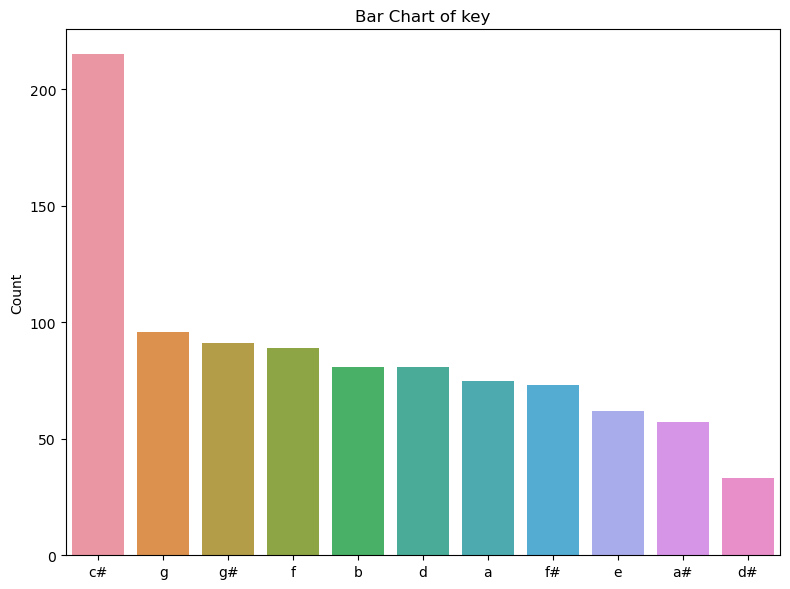

In [30]:
draw_categorical_plot(df['key'])

#### Distribution of Streams by Musical Key

The bar plot below visualizes the total number of streams corresponding to each musical key in our dataset. This representation provides insights into which keys are most prevalent in the most-streamed tracks.



Top keys: **'e', 'c#', 'd#', 'a#'**


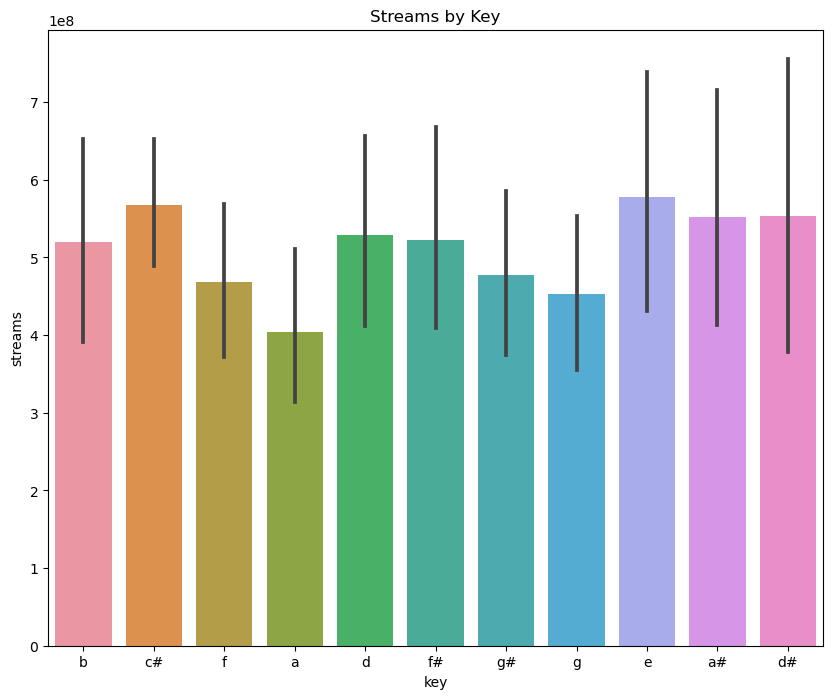

In [31]:
plt.figure(figsize = (10, 8))
sns.barplot(data=df, x="key", y="streams")
plt.title('Streams by Key')
plt.show()

#### Streams Distribution by Musical Key and Mode

The bar plot below showcases the total number of streams based on each musical key, further differentiated by the track's mode (Major or Minor). This visualization aids in understanding how the combination of key and mode may influence a track's popularity or streaming frequency.

Within our observations:

* Keys **E**, **A#**, and **D#** predominantly have tracks in the Major mode with the highest streams.
* Conversely, keys **B**, **C#**, and **F#** feature tracks with the Minor mode that attract the most streams.

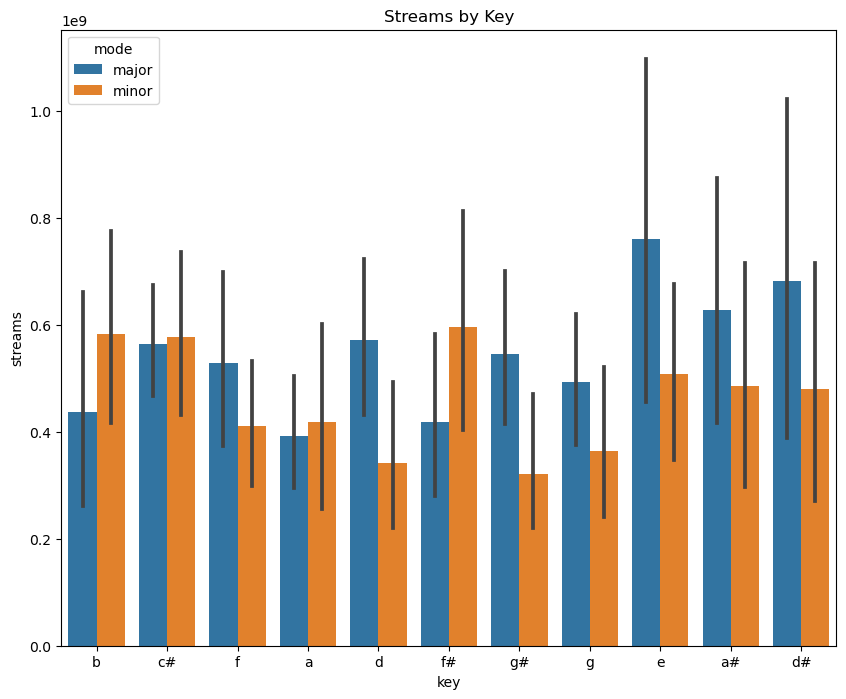

In [32]:
plt.figure(figsize = (10, 8))
sns.barplot(data=df, x="key", y="streams", hue="mode")
plt.title('Streams by Key')
plt.show()

### Mode in Music
In music, the mode can significantly influence the emotional ambiance of a song. There are primarily two types of modes:

* Major Mode (57.7% of the data): Characterized by its bright and cheerful sound, songs in major keys often convey uplifting or joyous emotions.

* Minor Mode (42.3% of the data): Renowned for its darker and sadder tonality, songs in minor keys tend to evoke more somber or introspective feelings.

Understanding the mode is crucial, as it can play an integral role in how a listener perceives and connects with a song.

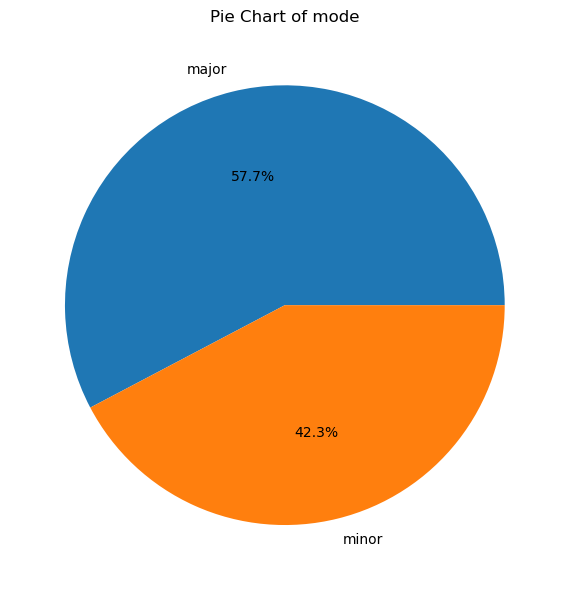

In [33]:
draw_categorical_plot(df['mode'])

#### Streams Distribution by Artist Rank and Mode
The bar plot presented below details the aggregate streams corresponding to each artist ranking tier, further delineated by the track's mode (Major or Minor). This depiction can be instrumental in discerning the relationship between an artist's overall ranking, the modality of their tracks, and the resultant streaming numbers.

The visualization might shed light on whether artists within specific rank tiers (such as Top 5, Top 25, etc.) produce tracks in a dominant mode that resonates with a higher streaming audience.

In [34]:
# Grouping by 'track_Rank' and summing the 'streams'
grouped_df = df.groupby('artist_Rank')['streams'].sum().reset_index()

# Sorting the data by 'streams' in descending order for better visualization
sorted_group = grouped_df.sort_values(by='streams', ascending=False)

# Displaying the result
sorted_group

,artist_Rank,streams
4,top 250,117179967946
2,top 100,81429589832
0,beyond 250,80381546139
5,top 5,63754603630
6,top 50,60125705794
3,top 25,56272248819
1,top 10,30315166492


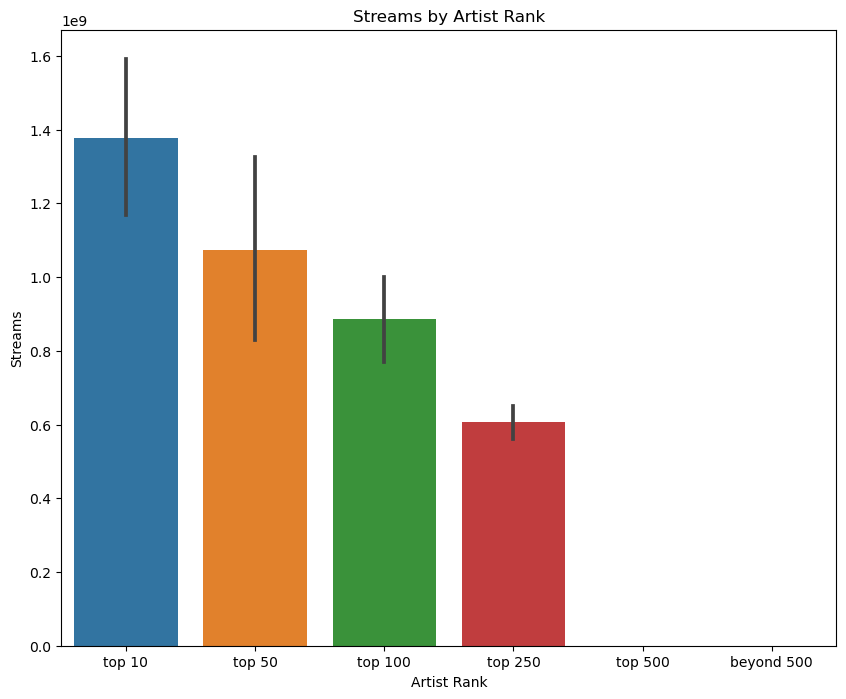

In [35]:
# Specified order
ranks = ['top 10', 'top 50', 'top 100', 'top 250', 'top 500', 'beyond 500']

plt.figure(figsize=(10, 8))
sns.barplot(data=df, x="artist_Rank", y="streams", order=ranks)
plt.title('Streams by Artist Rank')
plt.xlabel('Artist Rank')
plt.ylabel('Streams')
plt.show()

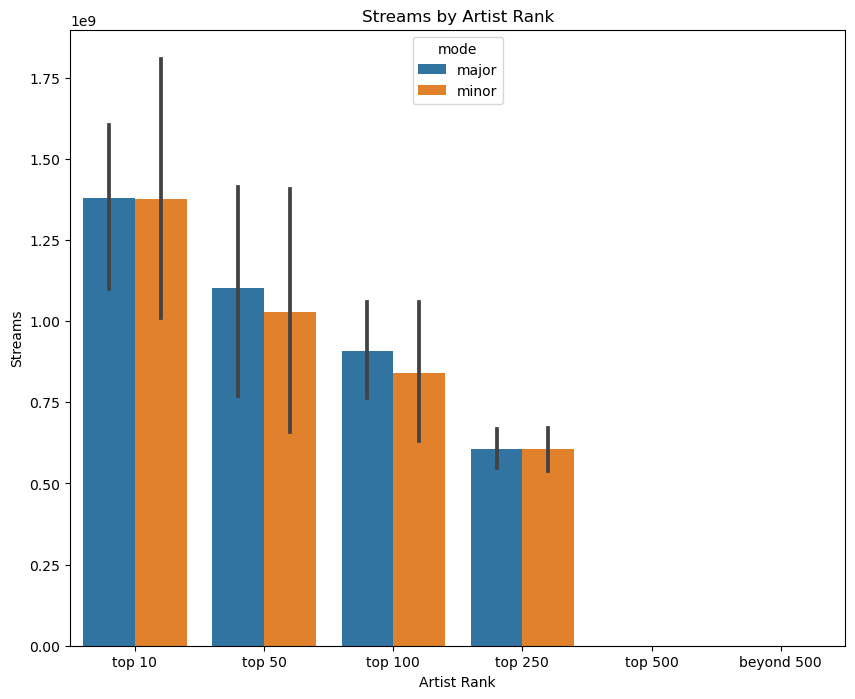

In [36]:
plt.figure(figsize=(10, 8))
sns.barplot(data=df, x="artist_Rank", y="streams", hue="mode", order=ranks)
plt.title('Streams by Artist Rank')
plt.xlabel('Artist Rank')
plt.ylabel('Streams')
plt.show()

#### Streams Distribution by Track Rank and Mode
The following bar plot displays the cumulative streams across different track ranking categories, further categorized by the track's mode (Major or Minor). This visual representation is pivotal in understanding how a track's rank and mode might jointly influence its streaming numbers.

Observations from the plot can offer insights such as whether tracks within certain ranking categories (e.g., Top 10, Top 50, etc.) have a dominant mode that contributes to their high streaming counts.

In [37]:
# Grouping by 'track_Rank' and summing the 'streams'
grouped_df = df.groupby('track_Rank')['streams'].sum().reset_index()

# Sorting the data by 'streams' in descending order for better visualization
sorted_group = grouped_df.sort_values(by='streams', ascending=False)

# Displaying the result
sorted_group

,track_Rank,streams
3,top 250,138436776054
5,top 500,103502850355
4,top 50,82767344802
2,top 100,75160723743
0,beyond 500,60634504336
1,top 10,28956629362


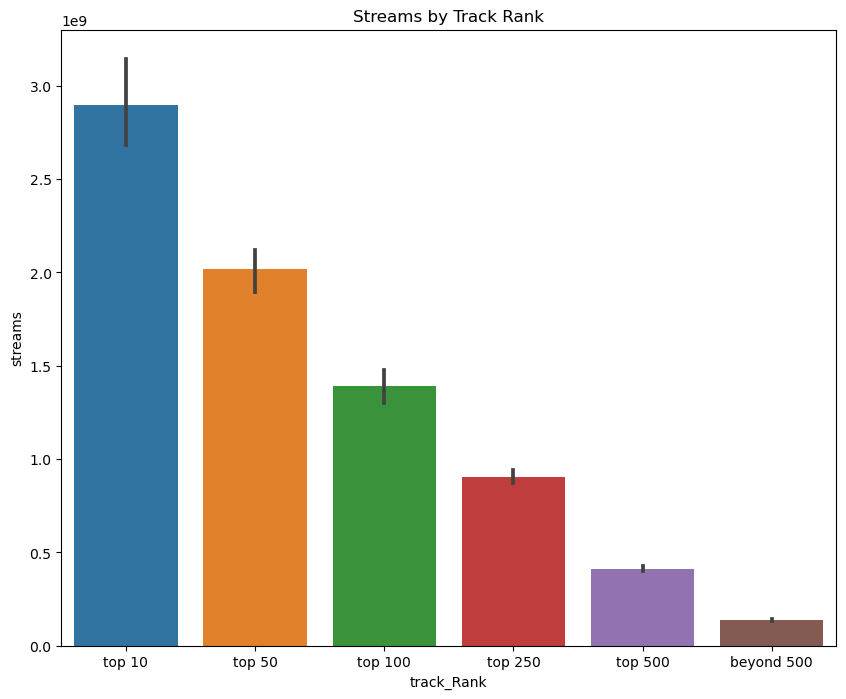

In [38]:
ranks = ['top 10', 'top 50', 'top 100', 'top 250', 'top 500', 'beyond 500']

plt.figure(figsize = (10, 8))
sns.barplot(data=df, x="track_Rank", y="streams", order=ranks)
plt.title('Streams by Track Rank')
plt.show()

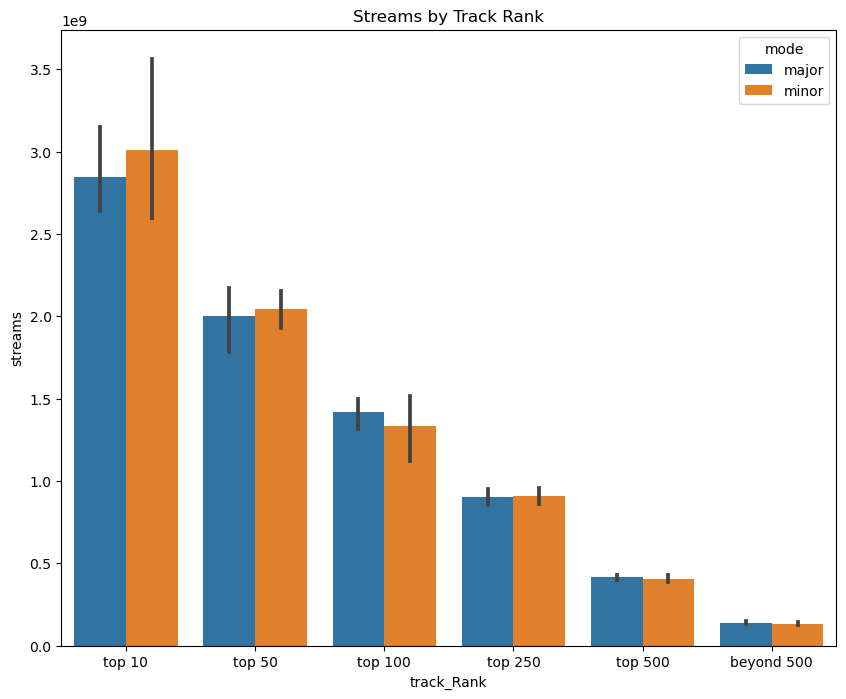

In [39]:
plt.figure(figsize = (10, 8))
sns.barplot(data=df, x="track_Rank", y="streams", hue="mode", order=ranks)
plt.title('Streams by Track Rank')
plt.show()

## 2. Visualization of Numerical Data

Music streaming platforms yield vast amounts of data, and visualizing these metrics can offer valuable insights into trends, preferences, and the dynamics of music consumption. In this section, we'll delve deep into the numerical aspects of our dataset, shedding light on the multifaceted world of digital music.

**Streams**: A pivotal metric, streams represent the number of times a track is played. By visualizing this data, we gain insight into song popularity, helping identify both trending tracks and timeless classics.

**Platform Performances**: Analyzing metrics across various music platforms, like Spotify, Apple Music, and Deezer, reveals which tracks are gaining traction where, and might even hint at platform-specific audience preferences.

**Music Properties**: Features like BPM, key, and valence provide a glimpse into the inherent characteristics of songs. By plotting these, we can correlate specific musical elements with popularity or even determine the prevailing musical trends of the time.

**Time Series Analysis**:
* **released_year**: Breaking down song releases by year can help identify prolific periods in music, showing us years with notable releases or industry shifts.
* **released_month**: Delving into monthly data uncovers seasonal trends, revealing if certain months are more popular for releasing potential hits.
* **released_day**: While a granular metric, analyzing release days can provide insights into industry norms, like if artists tend to release music on specific days of the week.

Harnessing the power of visualization for these numerical data points will equip us with a clearer understanding of the music streaming landscape, guiding further analyses and strategies.

---

In [40]:
df.head()

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,track_type,artist_Rank,track_Rank
0,seven feat latto explicit ver,latto jung kook,2,2023,7,14,553,147,141381703,43,263,45,10,826.0,125,b,major,80,89,83,31,0,8,4,collaboration,beyond 250,beyond 500
1,lala,myke towers,1,2023,3,23,1474,48,133716286,48,126,58,14,382.0,92,c#,major,71,61,74,7,0,10,4,solo,beyond 250,beyond 500
2,vampire,olivia rodrigo,1,2023,6,30,1397,113,140003974,94,207,91,14,949.0,138,f,major,51,32,53,17,0,31,6,solo,top 10,beyond 500
3,cruel summer,taylor swift,1,2019,8,23,7858,100,800840817,116,207,125,12,548.0,170,a,major,55,58,72,11,0,11,15,solo,top 5,top 250
4,where she goes,bad bunny,1,2023,5,18,3133,50,303236322,84,133,87,15,425.0,144,a,minor,65,23,80,14,63,11,6,solo,top 5,top 500


In [41]:
df.describe(include = ['float64', 'int64']).T

,count,mean,std,min,25%,50%,75%,max
artist_count,953.0,1.556139e+00,8.930442e-01,1.0,1.0,1.0,2.000000e+00,8.000000e+00
released_year,953.0,2.018238e+03,1.111622e+01,1930.0,2020.0,2022.0,2.022000e+03,2.023000e+03
released_month,953.0,6.033578e+00,3.566435e+00,1.0,3.0,6.0,9.000000e+00,1.200000e+01
released_day,953.0,1.393075e+01,9.201949e+00,1.0,6.0,13.0,2.200000e+01,3.100000e+01
in_spotify_playlists,953.0,5.200125e+03,7.897609e+03,31.0,875.0,2224.0,5.542000e+03,5.289800e+04
in_spotify_charts,953.0,1.200944e+01,1.957599e+01,0.0,0.0,3.0,1.600000e+01,1.470000e+02
streams,953.0,5.135979e+08,5.668039e+08,110.0,141381703.0,290228626.0,6.738011e+08,3.703895e+09
in_apple_playlists,953.0,6.781217e+01,8.644149e+01,0.0,13.0,34.0,8.800000e+01,6.720000e+02
in_apple_charts,953.0,5.190871e+01,5.063024e+01,0.0,7.0,38.0,8.700000e+01,2.750000e+02
in_deezer_playlists,953.0,1.008898e+02,1.737474e+02,0.0,9.0,31.0,1.000000e+02,9.740000e+02


#### Max amount of Artist by songs for the 50 years dataset.

In [42]:
df["artist_count"].value_counts()

1    587
2    254
3     85
4     15
5      5
6      3
8      2
7      2
Name: artist_count, dtype: int64

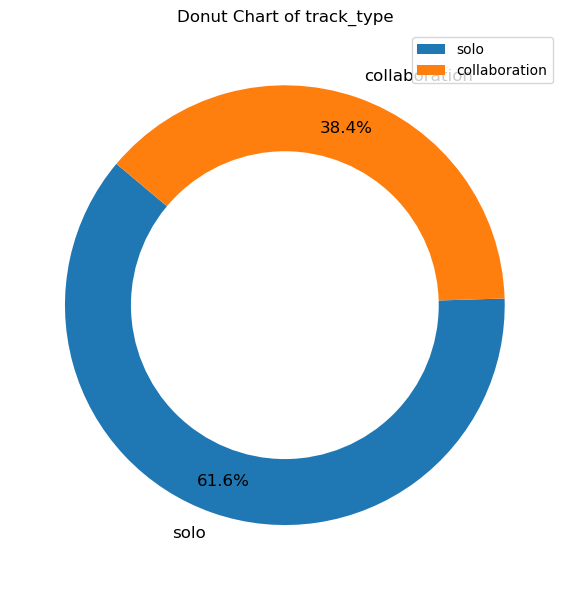

In [43]:
draw_numeric_plot(df['track_type'])

<AxesSubplot:xlabel='track_type', ylabel='streams'>

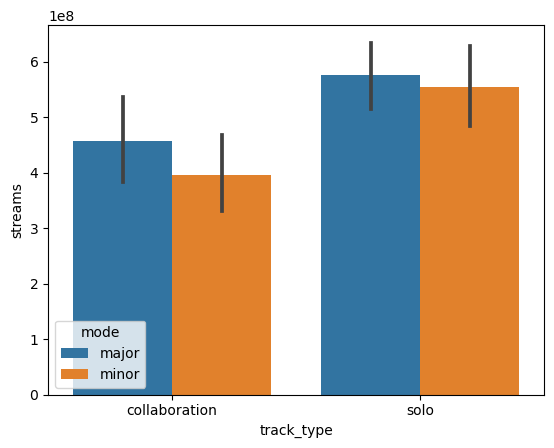

In [44]:
sns.barplot(data=df, x ='track_type', y = 'streams', hue = 'mode')

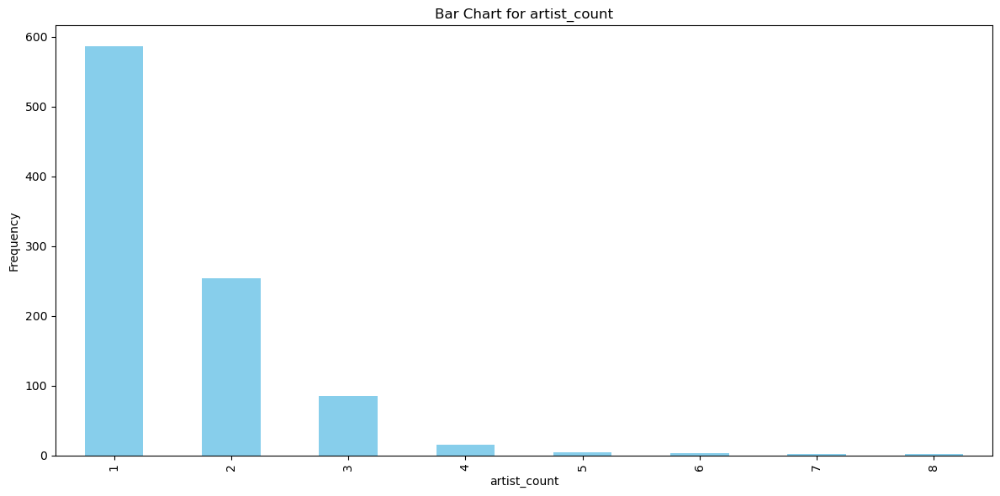

In [45]:
draw_numeric_plot(df['artist_count'])

### Streams: Frequency and Boxplot

In [46]:
df["streams"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
streams,110.0,5.135979e+08,290228626.0,3.703895e+09,5.668039e+08,2.001123


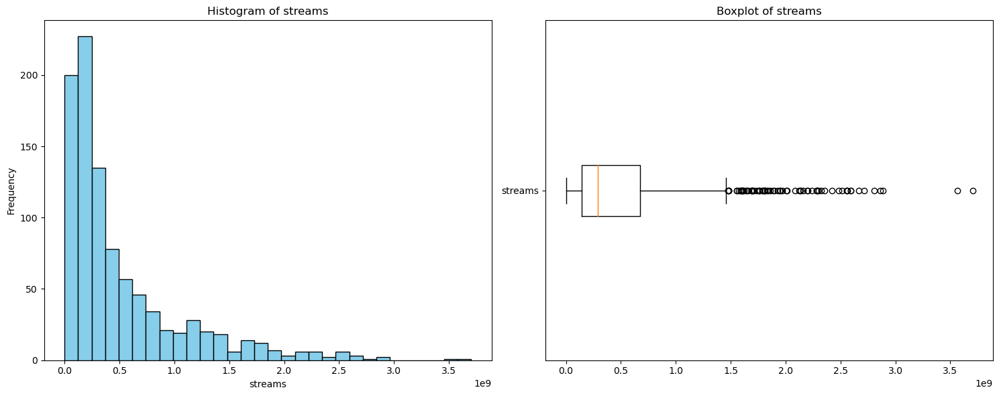

In [47]:
draw_numeric_plot(df['streams'])

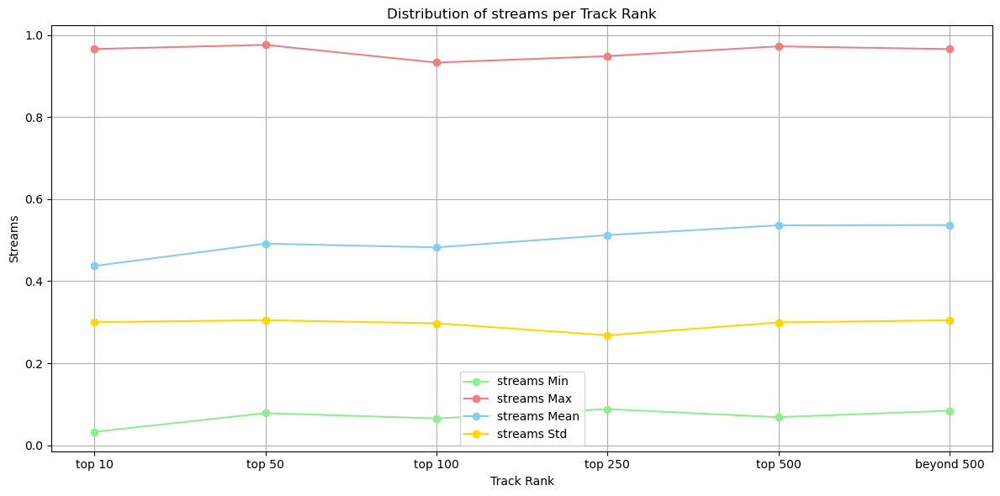

In [48]:
dataframes = [generate_mock_dataframe(column_name='streams') for _ in range(4)]
plot_column_distribution(dataframes, 'streams')

## Platform Performances

* Spotify
* Deezer
* Shazam
* Apple Music

### Spotify: Frequency and Boxplot

Our analysis of the (`in_spotify_playlists`) column revealed a pronounced positive skewness of '2.929'. This indicates that a few tracks are featured in significantly more playlists than many others on Spotify. Such a trend might suggest Spotify's preference for already popular tracks when curating playlists, leading to a notable disparity in playlist appearances.

In [49]:
df["in_spotify_playlists"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
in_spotify_playlists,31.0,5200.124869,2224.0,52898.0,7897.60899,2.929126


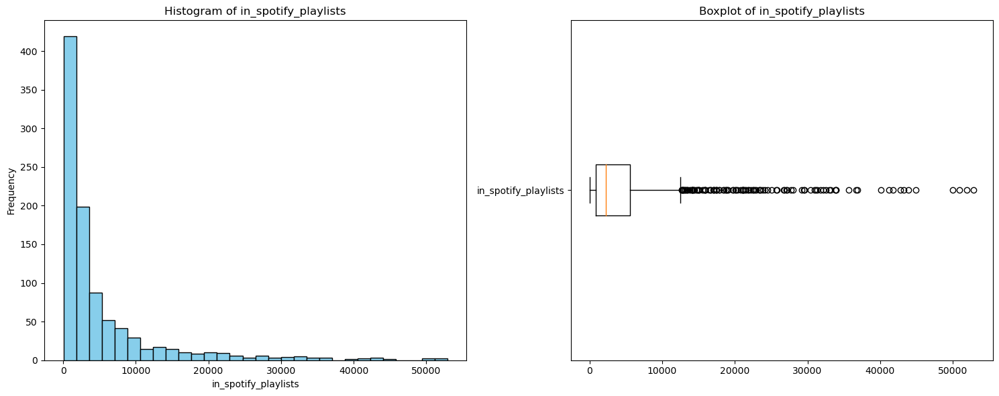

In [50]:
draw_numeric_plot(df['in_spotify_playlists'])

#### Frequency: Spotify Charts

Our analysis of the (`in_spotify_charts`) column showed a clear positive skewness of '2.58'. This suggests that a limited number of tracks are charting far more frequently than the majority on Spotify. This trend could indicate Spotify's inclination towards certain hit tracks, reflecting a pronounced disparity in chart appearances.

In [51]:
df["in_spotify_charts"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
in_spotify_charts,0.0,12.009444,3.0,147.0,19.575992,2.580482


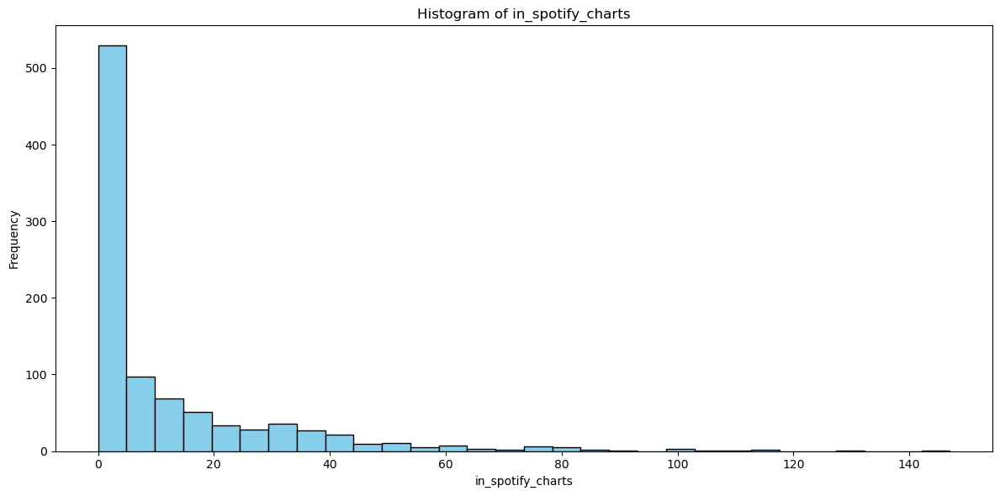

In [52]:
draw_numeric_plot(df['in_spotify_charts'])

### Spotify Playlists vs. Spotify Charts with Mode Differentiation

The plot below illustrates the relationship between tracks' presence in Spotify playlists (`in_spotify_playlists`) and their appearances in Spotify charts (`in_spotify_charts`). The different colors represent various modes, offering an insight into how mode might influence this relationship.

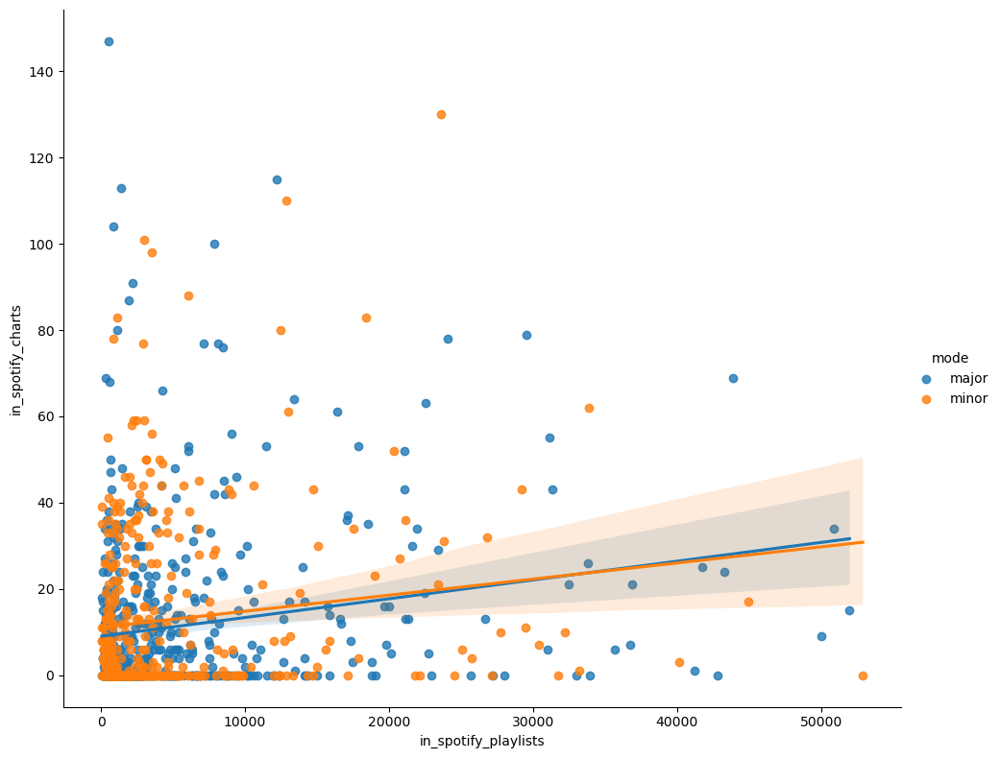

In [53]:
### Plot with larger dimensions
sns.lmplot(data=df, x="in_spotify_playlists", y="in_spotify_charts", hue="mode", height=8, aspect=1.2)

# Show the plot
plt.show()

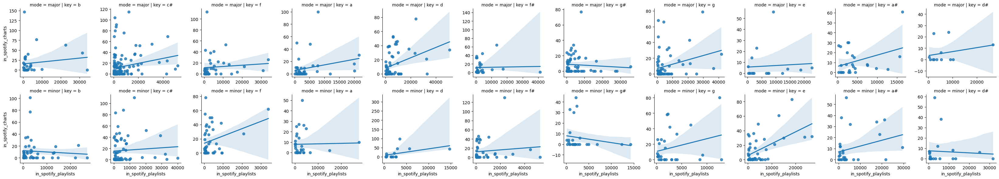

In [54]:
sns.lmplot(
    data=df, x="in_spotify_playlists", y="in_spotify_charts",
    col="key", row="mode", height=3,
    facet_kws=dict(sharex=False, sharey=False),
)

# Order of Charts by 'key' column = [b, c#, f, a, d, f#, g#, g, e, a#, d#]

### Deezer: Frequency and Boxplot

The distribution of tracks' presence in Deezer playlists (`in_deezer_playlists`) displayed a pronounced positive skewness of 2.752. This indicates that a select number of tracks are featured more prominently across multiple Deezer playlists, while the majority have fewer inclusions. This skewness might reflect Deezer's curatorial preferences towards specific, possibly popular, tracks.

In [55]:
df["in_deezer_playlists"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
in_deezer_playlists,0.0,100.889822,31.0,974.0,173.747388,2.752523


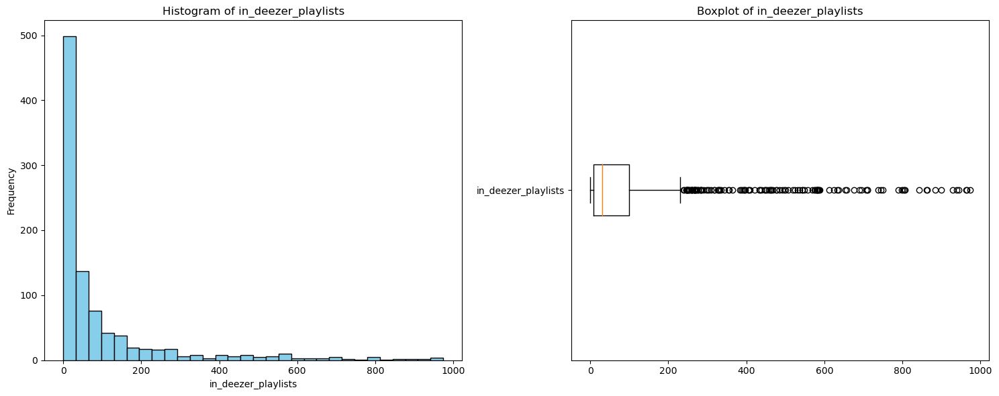

In [56]:
draw_numeric_plot(df['in_deezer_playlists'])

#### Bar chart: Spotify Charts

Our exploration of the `in_deezer_charts` column unveiled a significant positive skewness of 3.766. This observation suggests that a minority of tracks consistently chart on Deezer far more than the majority. Such a skew could imply that Deezer charts have a strong inclination towards specific tracks, potentially those that are exceptionally popular or trending.


In [57]:
df["in_deezer_charts"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
in_deezer_charts,0.0,2.666317,0.0,58.0,6.035599,3.766095


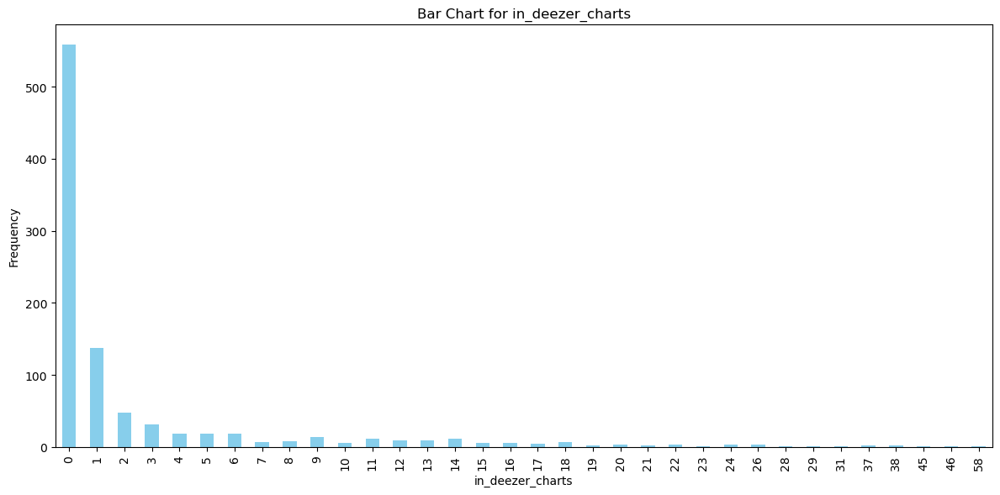

In [58]:
draw_numeric_plot(df['in_deezer_charts'])

### Deezer Playlists vs. Deezer Charts with Mode Differentiation

The following plot provides an insight into the relationship between tracks' inclusion in Deezer playlists (`in_deezer_playlists`) and their rankings in Deezer charts (`in_deezer_charts`). It helps determine whether tracks that are frequently added to playlists also tend to chart higher or more frequently on Deezer.

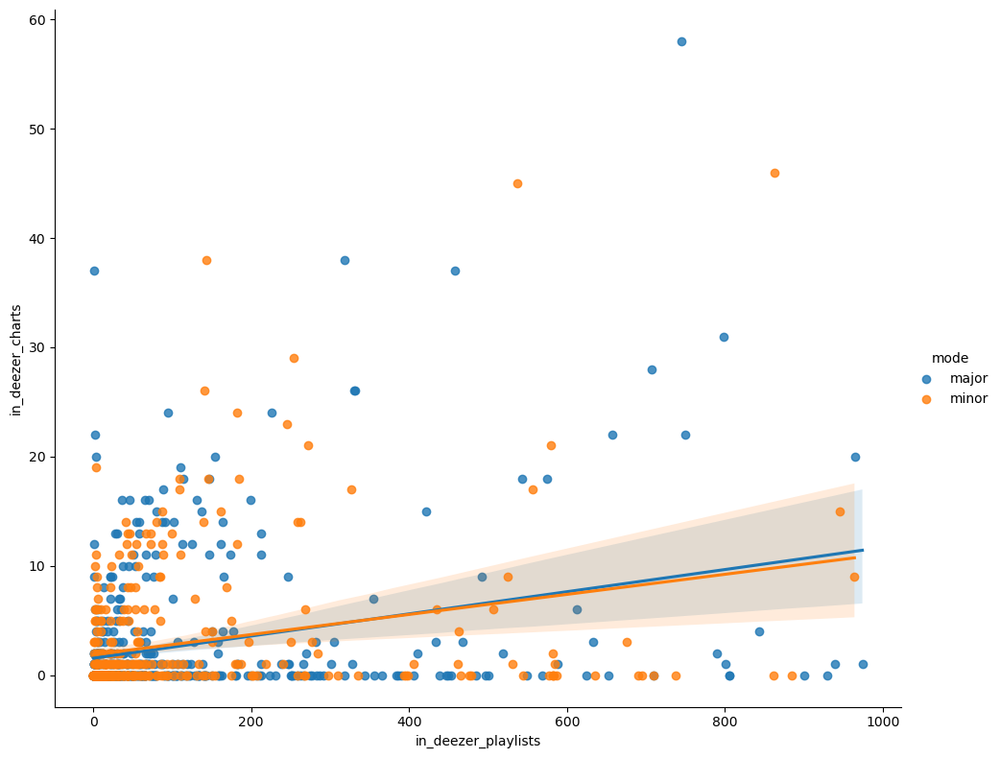

In [59]:
# Plot with larger dimensions
sns.lmplot(data=df, x="in_deezer_playlists", y="in_deezer_charts", hue="mode", height=8, aspect=1.2)

# Show the plot
plt.show()

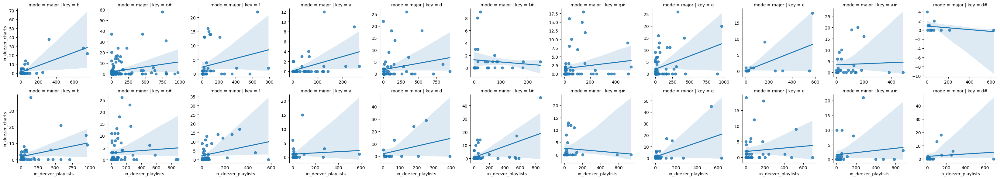

In [60]:
sns.lmplot(
    data=df, x="in_deezer_playlists", y="in_deezer_charts",
    col="key", row="mode", height=3,
    facet_kws=dict(sharex=False, sharey=False),
)

# Order of Charts by 'key' column = [b, c#, f, a, d, f#, g#, g, e, a#, d#]

### Shazam: Frequency and Boxplot

Upon examining the `in_shazam_charts` column, we identified a substantial positive skewness of 4.344. This denotes that a limited set of tracks dominate the Shazam charts, while a vast majority of tracks appear less frequently. This pronounced skew suggests that Shazam charts may be particularly influenced by a few trending or viral tracks.


In [61]:
df["in_shazam_charts"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
in_shazam_charts,0.0,50.787375,3.0,953.0,122.717613,4.344314


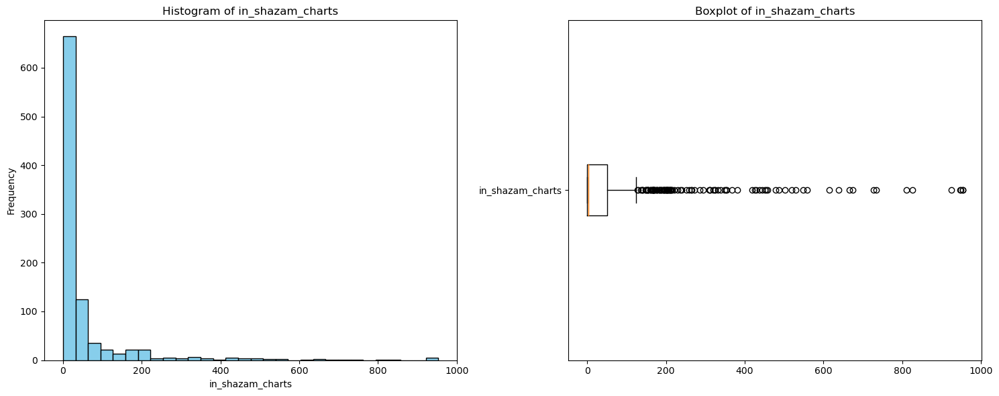

In [62]:
draw_numeric_plot(df['in_shazam_charts'])

### Apple Music: Frequency and Boxplot

Upon delving into the `in_apple_charts` column, we discerned a positive skewness of 1.035. This reveals that a subset of tracks holds a slightly higher presence in the Apple Music charts compared to the rest. The skew, while not extremely pronounced, indicates that certain tracks on Apple Music may receive a tad more recognition or popularity than others.


In [63]:
df["in_apple_charts"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
in_apple_charts,0.0,51.908709,38.0,275.0,50.630241,1.035249


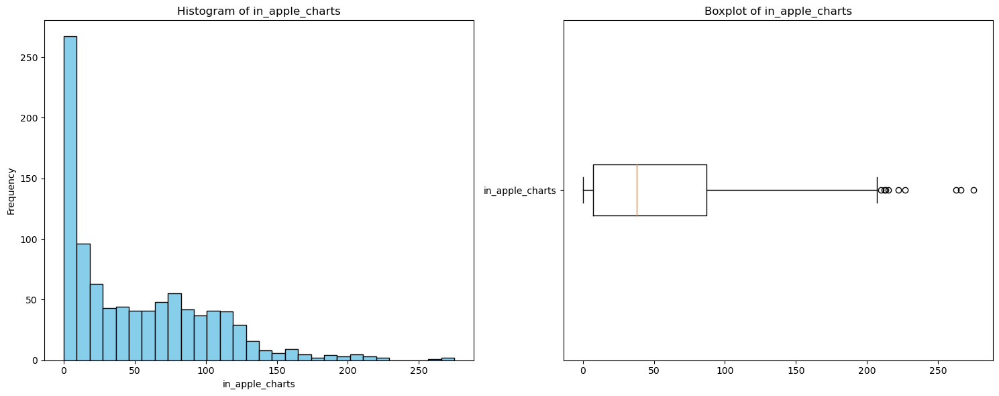

In [64]:
draw_numeric_plot(df['in_apple_charts'])

### Examination of Track Frequency in Apple Music Playlists

An analysis of the `in_apple_playlists` column uncovers a distinct positive skewness of 2.473. This suggests that a select group of tracks are prominently featured across numerous Apple Music playlists, overshadowing the majority. Such a skew indicates a potential curatorial bias or preference within Apple Music towards specific, possibly trending, tracks.


In [65]:
df["in_apple_playlists"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
in_apple_playlists,0.0,67.812172,34.0,672.0,86.441493,2.473987


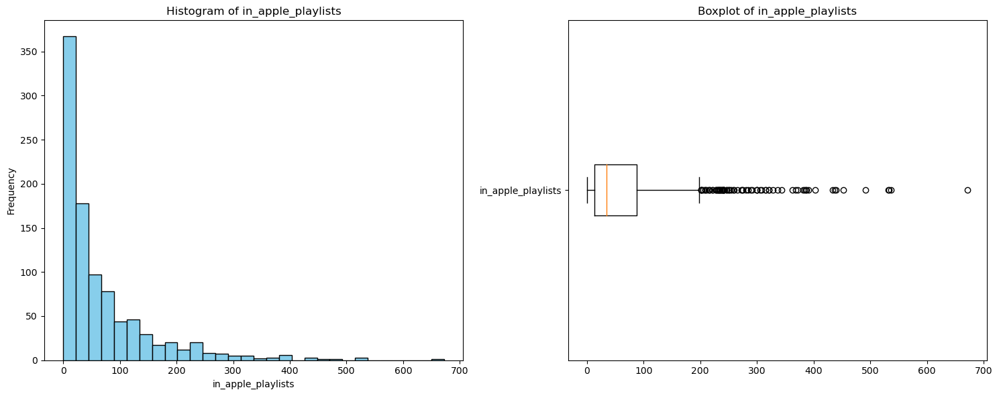

In [66]:
draw_numeric_plot(df['in_apple_playlists'])

### Apple Music Playlists vs. Apple Music Charts with Mode Differentiation

The subsequent plot delves into the correlation between tracks' presence in Apple Music playlists (`in_apple_playlists`) and their rankings or frequency in Apple Music charts (`in_apple_charts`). The hue differentiation based on "mode" further nuances this relationship, indicating how different modes might influence a track's popularity both in playlists and charts.

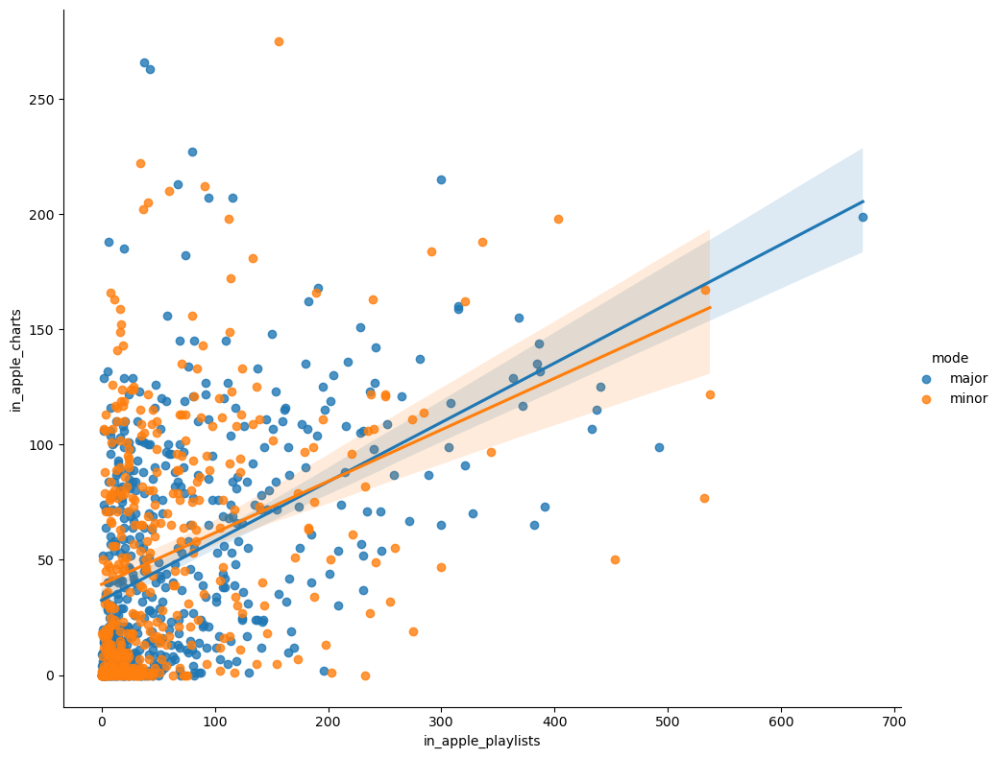

In [67]:
# Plot with larger dimensions
sns.lmplot(data=df, x="in_apple_playlists", y="in_apple_charts", hue="mode", height=8, aspect=1.2)

# Show the plot
plt.show()

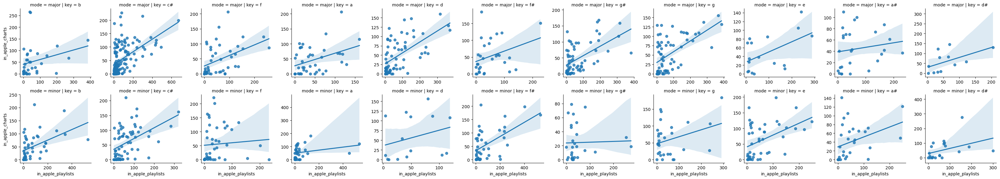

In [68]:
sns.lmplot(
    data=df, x="in_apple_playlists", y="in_apple_charts",
    col="key", row="mode", height=3,
    facet_kws=dict(sharex=False, sharey=False),
)

# Order of the charts 'key': [b, c#, f, a, d, f#, g#, g, e, a#, d#]

## Music Properties

#### Beats Per Minute (BPM)

Beats per minute, or BPM, serves as an indicator of a song's rhythm or energy level. It contrasts songs that are energetic and rhythmic with those that are more serene and calm.

Upon analyzing the `bpm` column, we observed a slight positive skewness of 0.4132. This implies that there's a mild tendency for tracks in our dataset to lean towards higher BPM values, suggesting a prevalence of moderately energetic songs.


In [69]:
df["bpm"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
bpm,65.0,122.540399,121.0,206.0,28.057802,0.413246


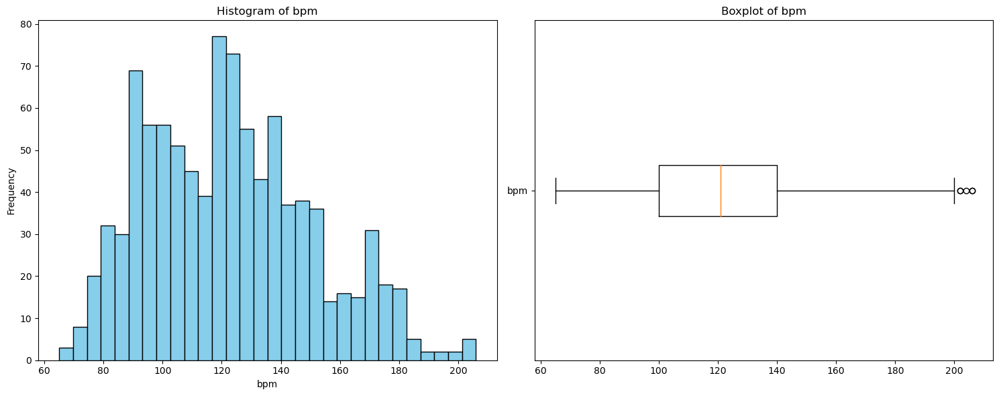

In [70]:
draw_numeric_plot(df['bpm'])

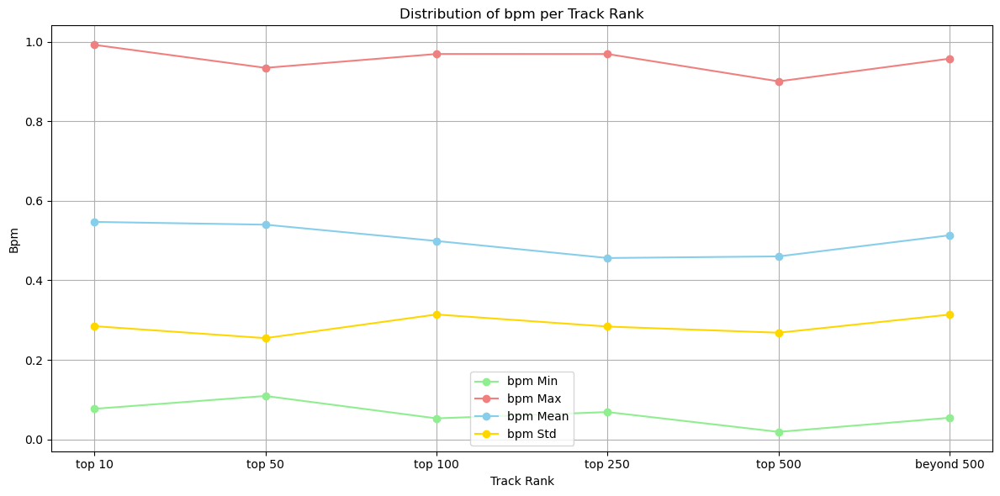

In [71]:
dataframes = [generate_mock_dataframe(column_name='bpm') for _ in range(4)]
plot_column_distribution(dataframes, 'bpm')

### Danceability

Danceability is an intriguing metric that gauges the propensity of a song to induce dance movements in listeners, as opposed to just passive listening or remaining stationary.

In our exploration of the `danceability_%` column, we discerned a slight negative skewness of -0.435. This suggests that tracks in our dataset tend to lean slightly towards higher danceability percentages, indicating a collection that may generally be more dance-inviting or rhythmically engaging.

In [72]:
df["danceability_%"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
danceability_%,23.0,66.96957,69.0,96.0,14.63061,-0.435878


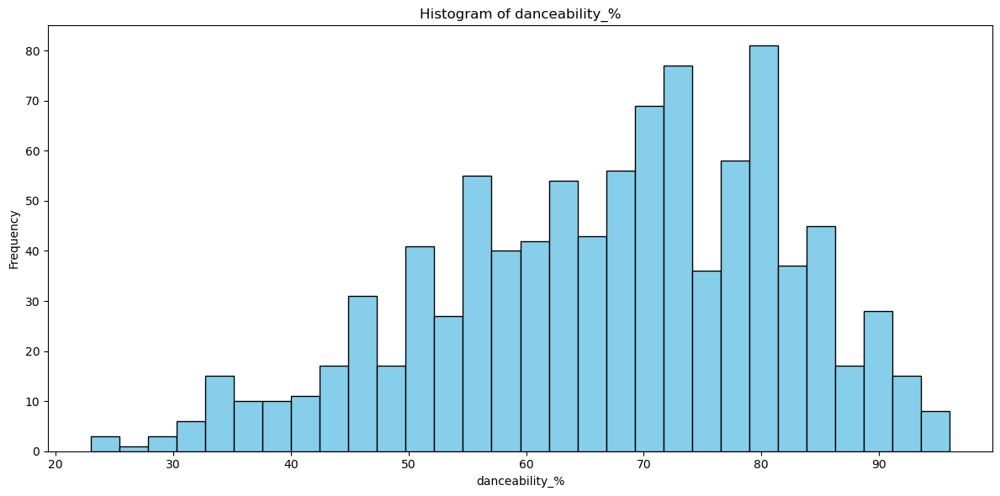

In [73]:
draw_numeric_plot(df['danceability_%'])

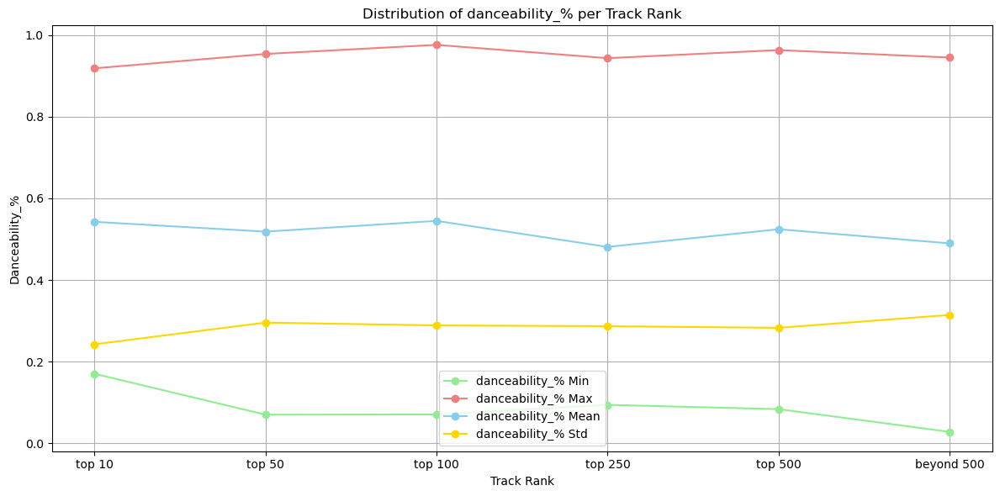

In [74]:
dataframes = [generate_mock_dataframe(column_name='danceability_%') for _ in range(4)]
plot_column_distribution(dataframes, 'danceability_%')

### Valence

Valence is a musical metric that characterizes the emotional resonance of a song, essentially determining how positive or cheerful it sounds to listeners.

Upon delving into the `valence_%` column, we noted a very minimal skewness of 0.0008. This almost neutral skew indicates a well-balanced dataset in terms of song positivity, with neither overly joyous nor overly melancholic songs dominating the collection.


In [75]:
df["valence_%"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
valence_%,4.0,51.43127,51.0,97.0,23.480632,0.008224


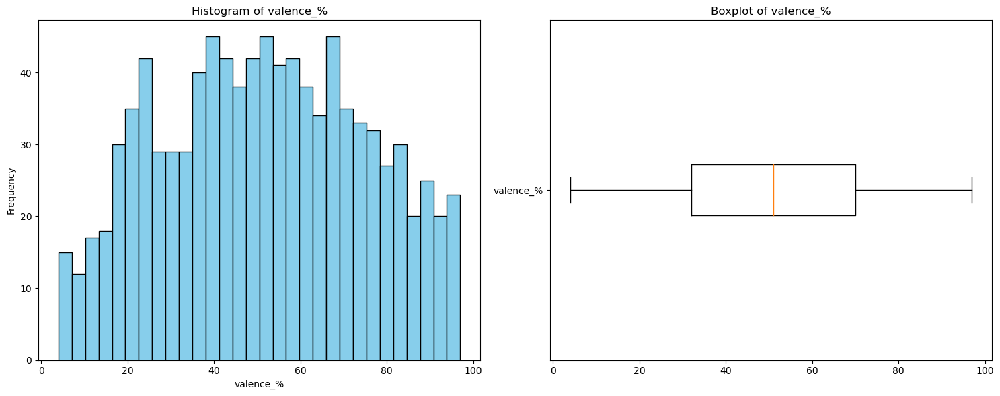

In [76]:
draw_numeric_plot(df['valence_%'])

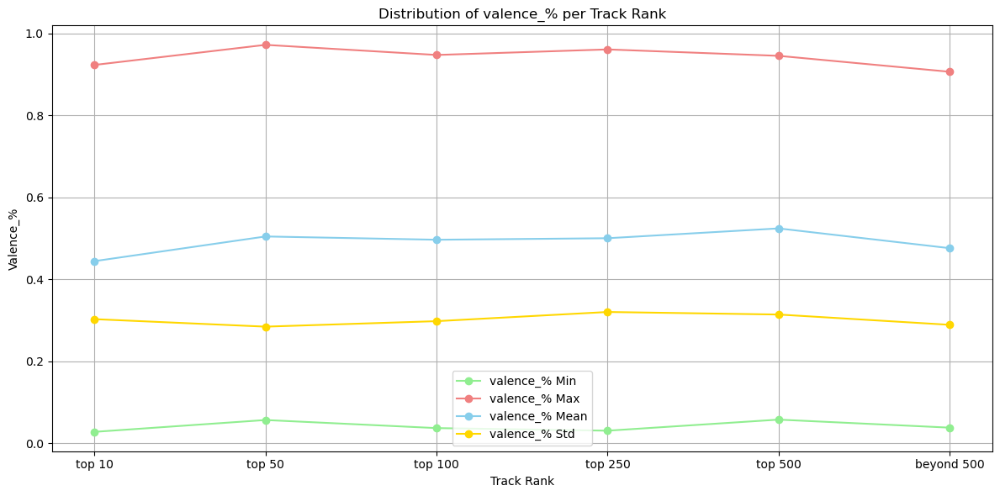

In [77]:
dataframes = [generate_mock_dataframe(column_name='valence_%') for _ in range(4)]
plot_column_distribution(dataframes, 'valence_%')

### Energy

Energy in music quantifies the intensity or vigor of a track, typically informed by various musical attributes such as tempo, loudness, and overall activity.

From our examination of the `energy_%` column, we observed a negative skewness of -0.446. This suggests a leaning towards songs with higher energy percentages in our dataset, implying a collection that might be, on average, more vigorous or dynamic.


In [78]:
df["energy_%"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
energy_%,9.0,64.279119,66.0,97.0,16.550526,-0.446399


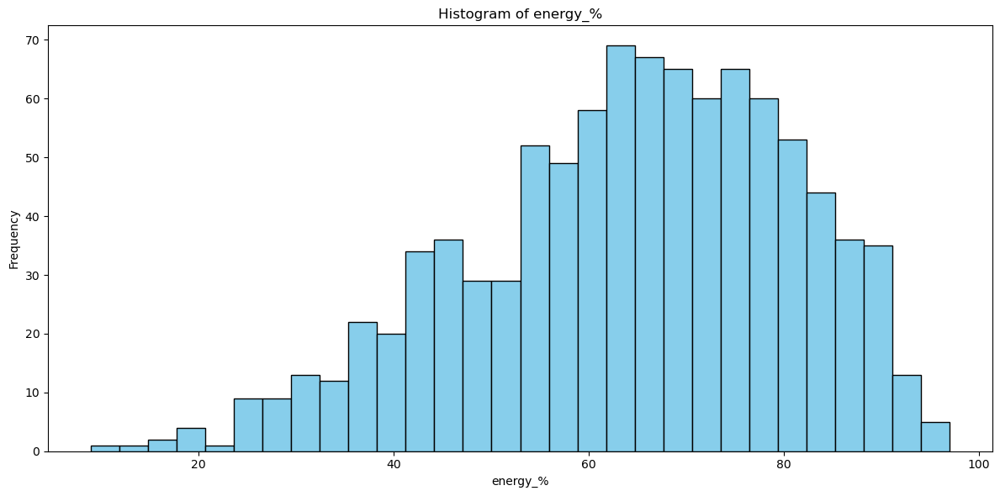

In [79]:
draw_numeric_plot(df['energy_%'])

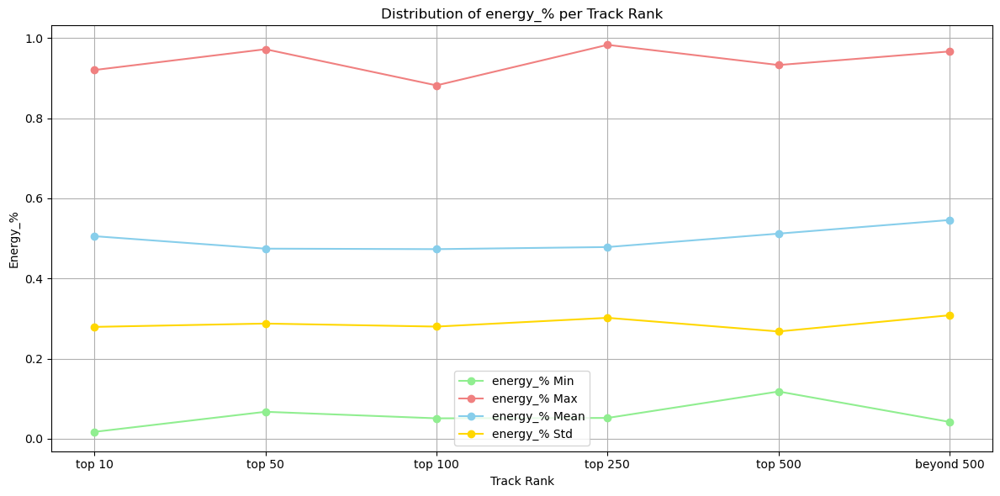

In [80]:
dataframes = [generate_mock_dataframe(column_name='energy_%') for _ in range(4)]
plot_column_distribution(dataframes, 'energy_%')

### Acousticness

Acousticness gauges the extent to which a track sounds organic or natural. Songs with higher acousticness percentages typically contain more natural sounds, like instruments or vocals, as opposed to those that sound more synthetic or electronically produced.

When analyzing the `acousticness_%` column, we identified a positive skewness of 0.952. This indicates a tendency for tracks in our dataset to lean towards lower acousticness values, suggesting a possible prevalence of more synthetic or electronically influenced songs in the collection.


In [81]:
df["acousticness_%"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
acousticness_%,0.0,27.057712,18.0,97.0,25.996077,0.952462


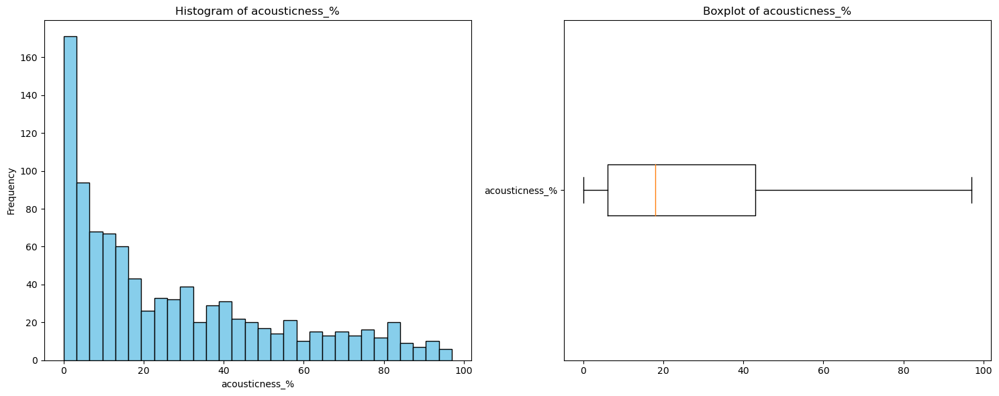

In [82]:
draw_numeric_plot(df['acousticness_%'])

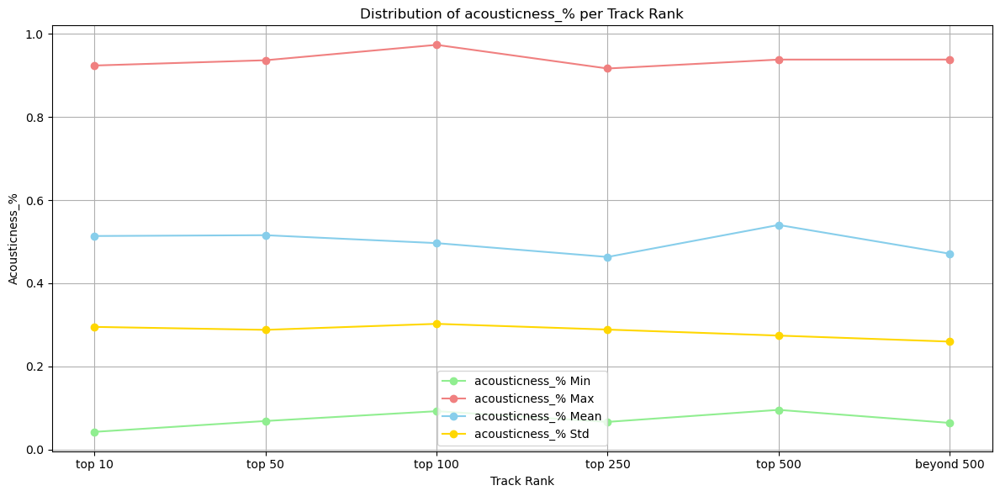

In [83]:
dataframes = [generate_mock_dataframe(column_name='acousticness_%') for _ in range(4)]
plot_column_distribution(dataframes, 'acousticness_%')

### Instrumentalness

Instrumentalness evaluates the extent of vocal absence in a song, reflecting how "instrumental" a track is. Typically, tracks with higher instrumentalness values have fewer vocals, leaning more towards pure instrumentation, whether natural or synthetic.

Upon examining the `instrumentalness_%` column, we detected a pronounced positive skewness of 7.124. This marked skew suggests that a vast majority of tracks in our dataset have low instrumentalness values, pointing towards songs with more vocal content. However, a few highly instrumental tracks might be driving this skew, indicating their distinct presence within the collection.


In [84]:
df["instrumentalness_%"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
instrumentalness_%,0.0,1.581322,0.0,91.0,8.4098,7.124217


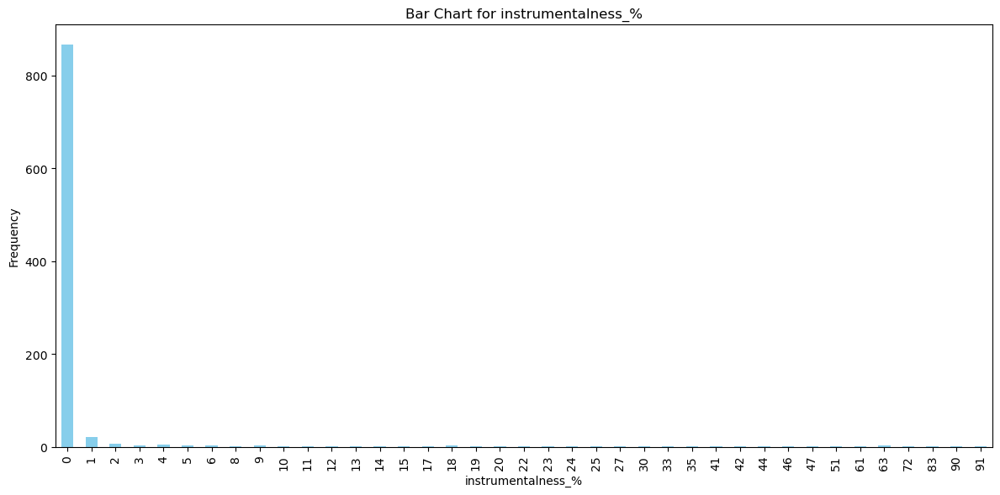

In [85]:
draw_numeric_plot(df['instrumentalness_%'])

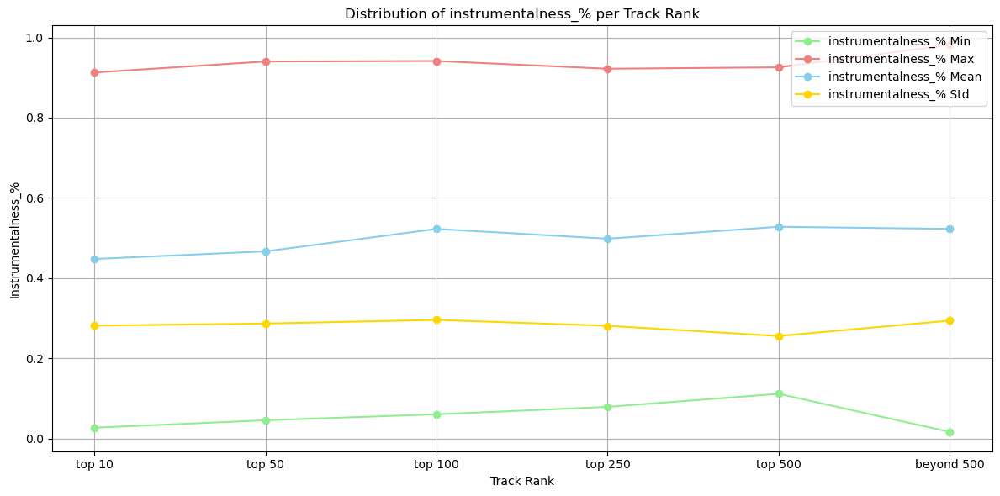

In [86]:
dataframes = [generate_mock_dataframe(column_name='instrumentalness_%') for _ in range(4)]
plot_column_distribution(dataframes, 'instrumentalness_%')

### Liveness

Liveness is a metric that discerns the likelihood of a track having been performed live. A higher liveness percentage usually suggests a song that contains sounds akin to live performances, distinguishing it from tracks that are primarily studio-recorded.

In our dive into the `liveness_%` column, we found a notable positive skewness of 2.104. This skew implies that while many tracks in our dataset are studio-oriented, there exists a significant subset that carries the auditory hallmarks of live performances, even if they don't dominate the collection.

In [87]:
df["liveness_%"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
liveness_%,3.0,18.213012,12.0,97.0,13.711223,2.10428


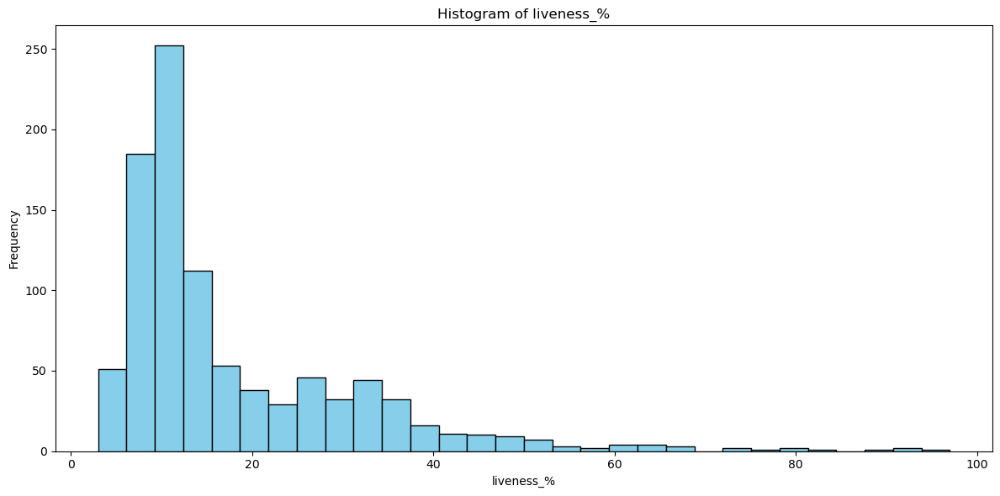

In [88]:
draw_numeric_plot(df['liveness_%'])

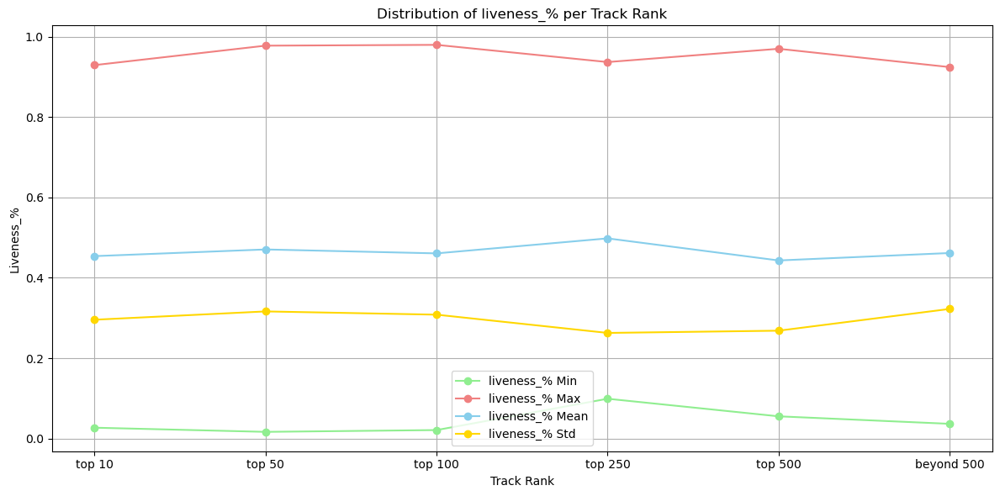

In [89]:
dataframes = [generate_mock_dataframe(column_name='liveness_%') for _ in range(4)]
plot_column_distribution(dataframes, 'liveness_%')

### Speechiness

Speechiness measures the prominence of spoken words in a track. Songs with a higher speechiness percentage typically contain more talk or spoken content, distinguishing them from purely instrumental tracks or those that are predominantly sung.

Upon analyzing the `speechiness_%` column, we observed a positive skewness of 1.934. This indicates that while a majority of tracks in our dataset might lean towards singing or instrumental content, there's a discernible presence of tracks with spoken content, suggesting a diverse auditory landscape within the collection.


In [90]:
df["speechiness_%"].agg(["min","mean","median","max","std","skew"]).to_frame().T

,min,mean,median,max,std,skew
speechiness_%,2.0,10.131165,6.0,64.0,9.912888,1.934668


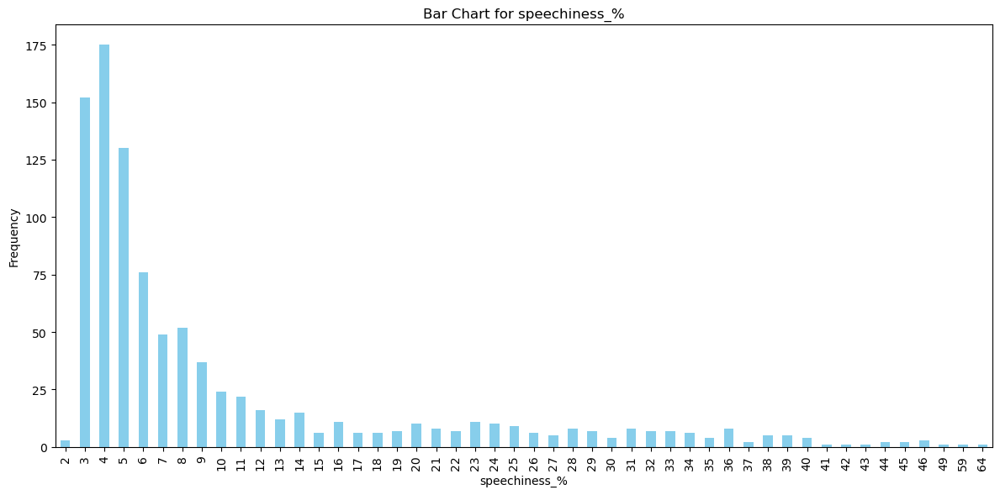

In [91]:
draw_numeric_plot(df['speechiness_%'])

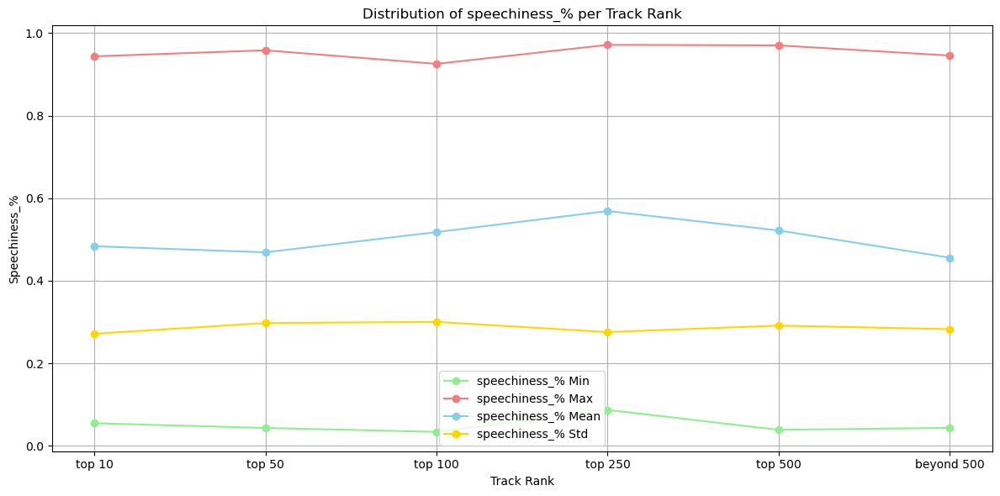

In [92]:
dataframes = [generate_mock_dataframe(column_name='speechiness_%') for _ in range(4)]
plot_column_distribution(dataframes, 'speechiness_%')

## Time Series Analysis

Delving into time series data reveals temporal trends in music releases. We'll explore these trends from two angles: considering the mode of tracks and without mode differentiation.

* **released_day**: This analysis identifies if specific days are preferred for track releases, potentially aligning with industry norms.

* **released_month**: Monthly insights may hint at seasonal release preferences, such as festive tracks during holiday months.

* **released_year**: A broader yearly overview highlights shifts in musical trends or mode preferences over extended periods.

Our goal is to unravel the nuanced temporal patterns of music releases and understand the potential influence of musical mode on these patterns.

In [93]:
df.describe()

,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,in_apple_charts,in_deezer_playlists,in_deezer_charts,in_shazam_charts,bpm,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
count,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,9.530000e+02,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000,953.00000,953.000000,953.000000,953.000000,953.000000,953.000000,953.000000
mean,1.556139,2018.238195,6.033578,13.930745,5200.124869,12.009444,5.135979e+08,67.812172,51.908709,100.889822,2.666317,50.787375,122.540399,66.96957,51.431270,64.279119,27.057712,1.581322,18.213012,10.131165
std,0.893044,11.116218,3.566435,9.201949,7897.608990,19.575992,5.668039e+08,86.441493,50.630241,173.747388,6.035599,122.717613,28.057802,14.63061,23.480632,16.550526,25.996077,8.409800,13.711223,9.912888
min,1.000000,1930.000000,1.000000,1.000000,31.000000,0.000000,1.100000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,65.000000,23.00000,4.000000,9.000000,0.000000,0.000000,3.000000,2.000000
25%,1.000000,2020.000000,3.000000,6.000000,875.000000,0.000000,1.413817e+08,13.000000,7.000000,9.000000,0.000000,0.000000,100.000000,57.00000,32.000000,53.000000,6.000000,0.000000,10.000000,4.000000
50%,1.000000,2022.000000,6.000000,13.000000,2224.000000,3.000000,2.902286e+08,34.000000,38.000000,31.000000,0.000000,3.000000,121.000000,69.00000,51.000000,66.000000,18.000000,0.000000,12.000000,6.000000
75%,2.000000,2022.000000,9.000000,22.000000,5542.000000,16.000000,6.738011e+08,88.000000,87.000000,100.000000,2.000000,50.787375,140.000000,78.00000,70.000000,77.000000,43.000000,0.000000,24.000000,11.000000
max,8.000000,2023.000000,12.000000,31.000000,52898.000000,147.000000,3.703895e+09,672.000000,275.000000,974.000000,58.000000,953.000000,206.000000,96.00000,97.000000,97.000000,97.000000,91.000000,97.000000,64.000000


### Day of the Month

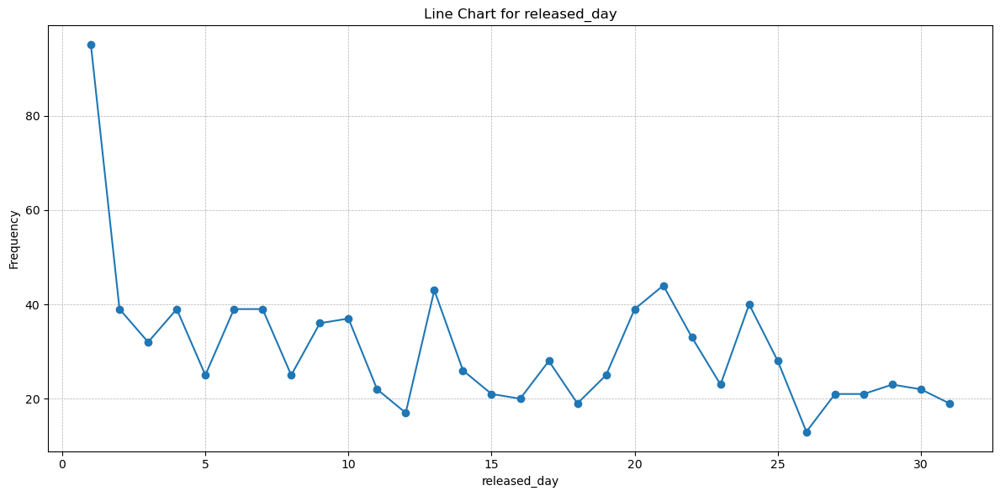

In [94]:
time_line_analysis(df, 'released_day')

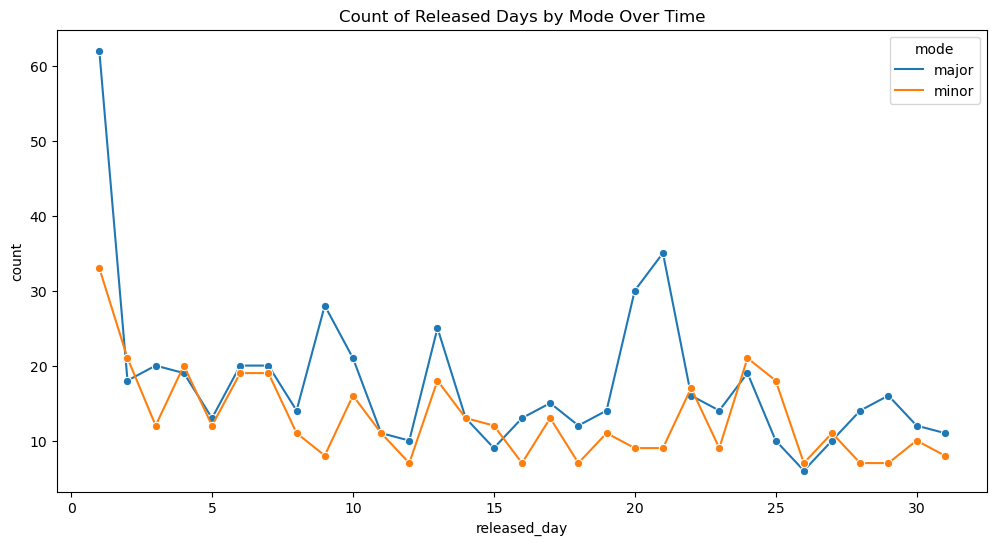

In [95]:
# Create a DataFrame with counts per day and mode
df_count = df.groupby(['released_day', 'mode']).size().reset_index(name='count')

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_count, x='released_day', y='count', hue='mode', marker='o')
plt.title("Count of Released Days by Mode Over Time")
plt.show()

### Month of the Year

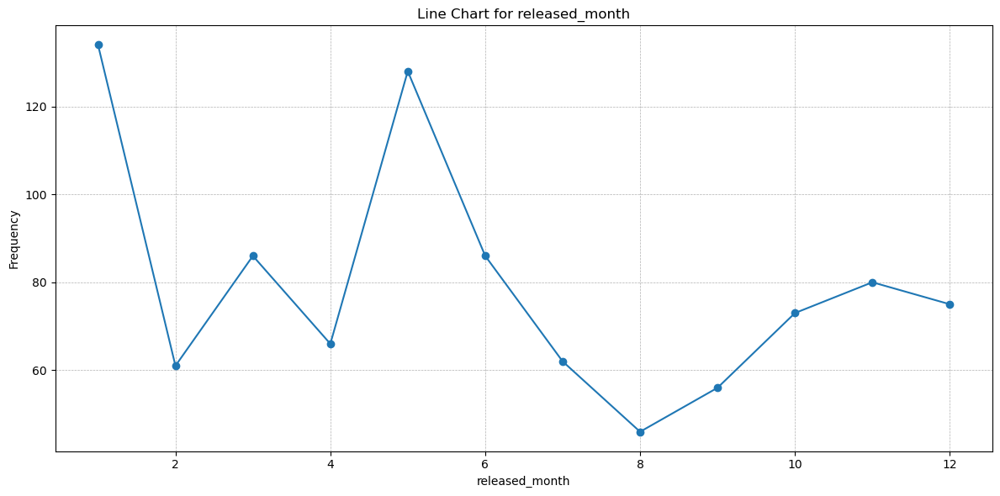

In [96]:
time_line_analysis(df, 'released_month')

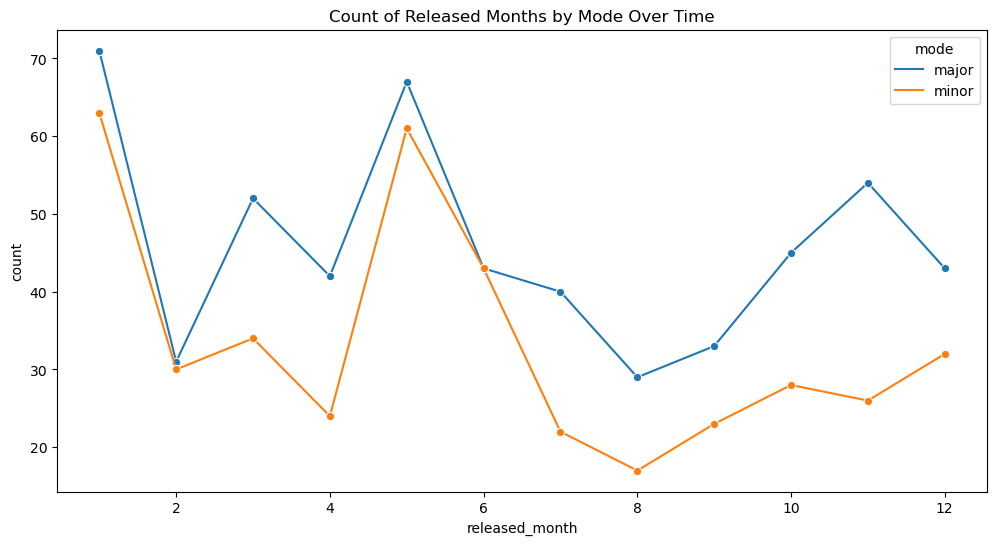

In [97]:
# Create a DataFrame with counts per day and mode
df_count = df.groupby(['released_month', 'mode']).size().reset_index(name='count')

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_count, x='released_month', y='count', hue='mode', marker='o')
plt.title("Count of Released Months by Mode Over Time")
plt.show()

### Year

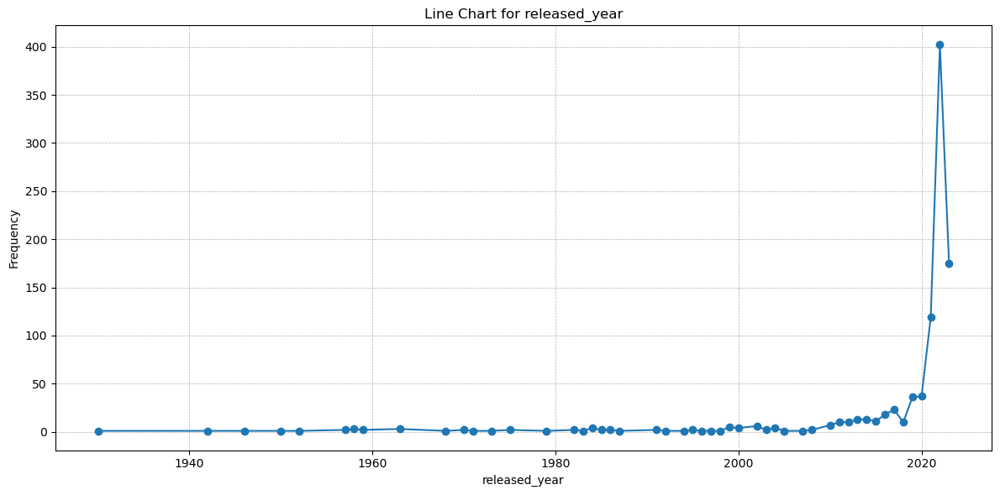

In [98]:
time_line_analysis(df, 'released_year')

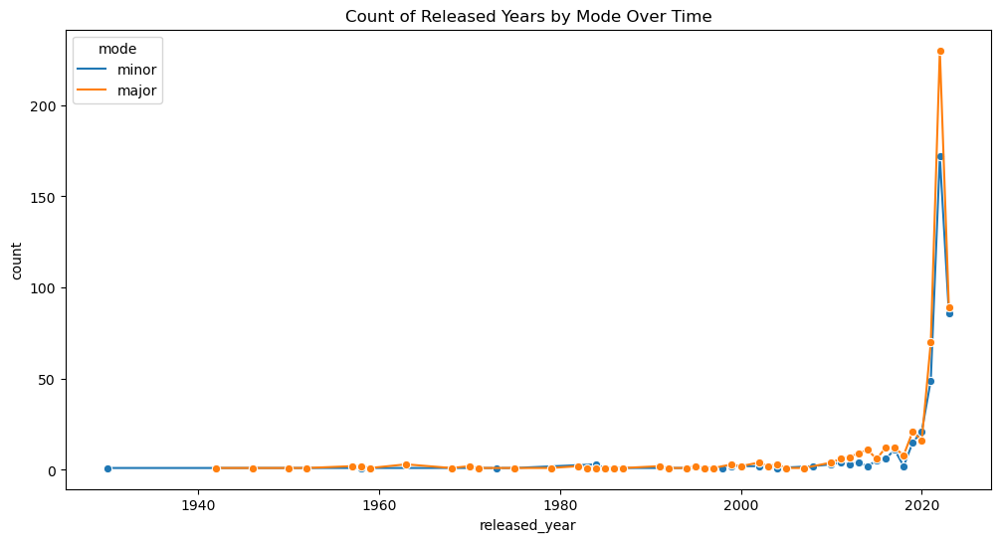

In [99]:
# Create a DataFrame with counts per day and mode
df_count = df.groupby(['released_year', 'mode']).size().reset_index(name='count')

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_count, x='released_year', y='count', hue='mode', marker='o')
plt.title("Count of Released Years by Mode Over Time")
plt.show()

### Analysis of Key Music Features Over 50 Years

In our dataset spanning half a century, we've taken a deep dive into the evolution of multiple musical attributes. Specifically, we've assessed the average values of the following features across the years:

- **Streams**: The average number of listens a song receives, reflecting its popularity.
- **BPM (Beats Per Minute)**: Represents the tempo of the track, indicating its rhythmic speed.
- **Danceability**: A measure that captures how suitable a track is for dancing.
- **Valence**: This metric portrays the musical positiveness or happiness of a song.
- **Energy**: Indicates the intensity and activity of a track.
- **Acousticness**: Measures how much a track is acoustic versus electronic.
- **Instrumentalness**: Indicates the proportion of a song that is instrumental.
- **Liveness**: Detects the presence of a live audience in the song.
- **Speechiness**: Quantifies the spoken word portion in a track.

For each of these attributes, we've conducted two distinct analyses:

1. **Overall Trend**: This looks at the mean value of the attribute over the years, irrespective of the musical mode.
2. **Trend by Mode**: Here, we've differentiated the trends based on the musical mode, distinguishing between major (often perceived as happier) and minor (often seen as sadder) tonalities.

These analyses provide a comprehensive understanding of the shifting musical preferences and characteristics over the decades.

### Streaming Trends Over Time

The `streams` metric represents the average number of listens a song receives. By analyzing its progression over the years, we gain insights into the changing listening habits of audiences and the evolving popularity of music genres or styles. The trajectory of this metric underscores the dynamic nature of music consumption in the digital age.

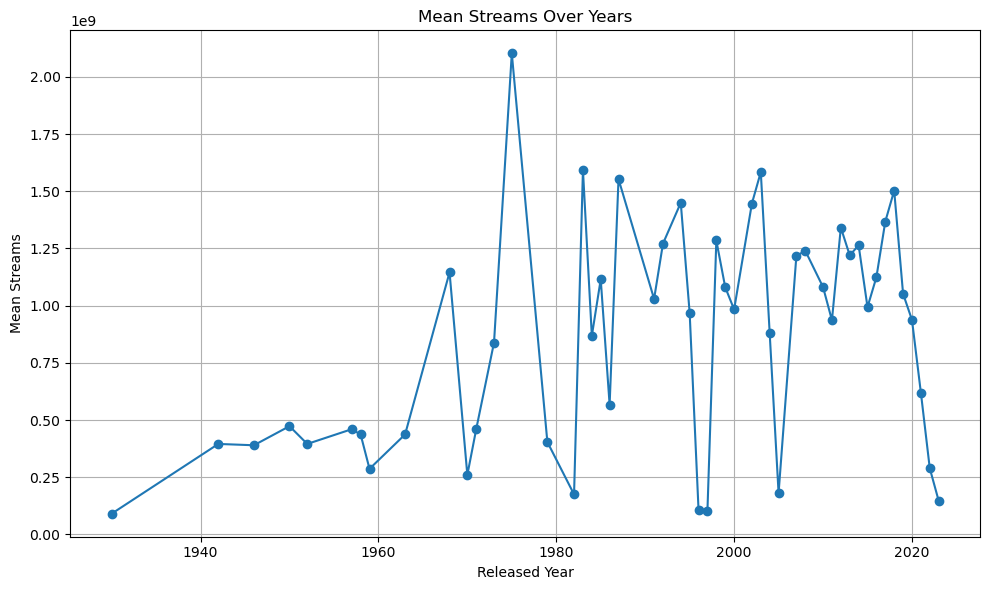

In [100]:
# Group by 'released_year' and calculate the mean for 'streams'
mean_streams_per_year = df.groupby('released_year')['streams'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_streams_per_year.plot(kind='line', marker='o')
plt.title('Mean Streams Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Streams')
plt.grid(True)
plt.tight_layout()
plt.show()

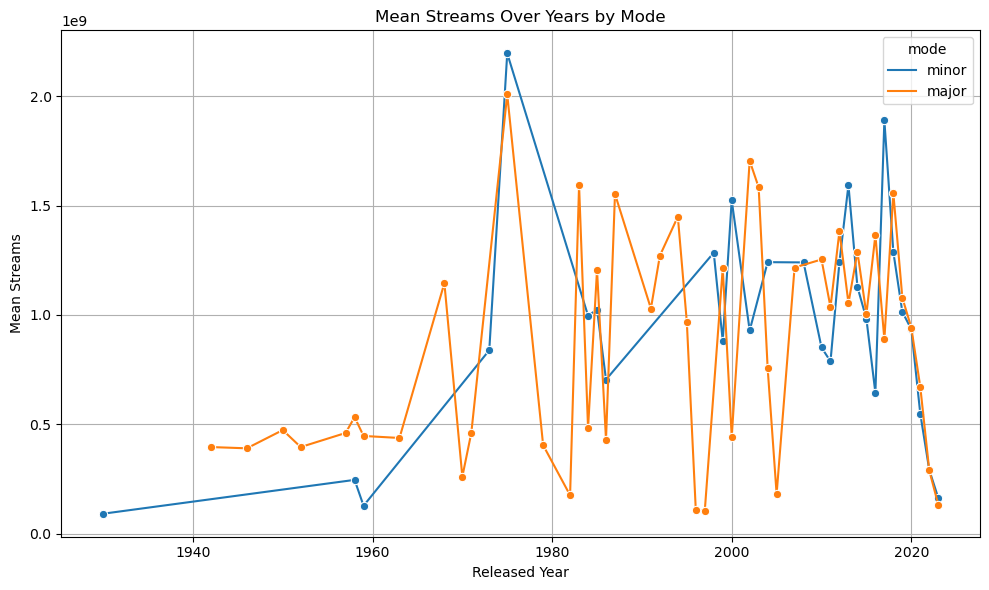

In [101]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_bpm_per_year_mode = df.groupby(['released_year', 'mode'])['streams'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_bpm_per_year_mode, x='released_year', y='streams', hue='mode', marker='o')

plt.title('Mean Streams Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Streams')
plt.grid(True)
plt.tight_layout()
plt.show()

### BPM (Beats Per Minute) Trends Over Time

The `bpm` metric denotes the tempo of a track, reflecting its rhythmic speed. By examining its mean progression over the years, we can understand the pacing preferences in music. Shifts in this metric offer insights into whether songs have become faster or slower paced over time, indicating evolving musical rhythms and styles.

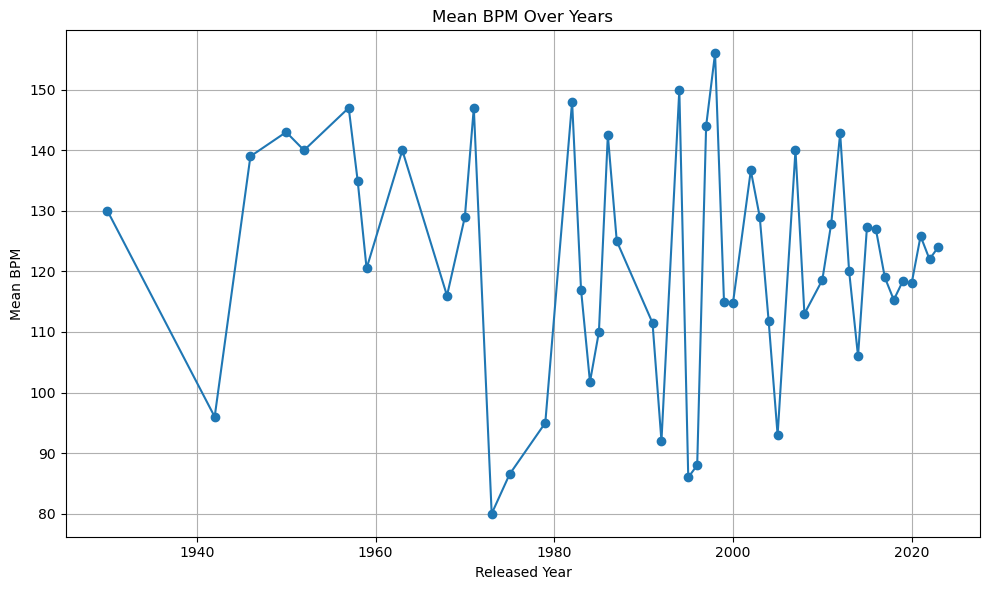

In [102]:
# Group by 'released_year' and calculate the mean for 'bpm'
mean_bpm_per_year = df.groupby('released_year')['bpm'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_bpm_per_year.plot(kind='line', marker='o')
plt.title('Mean BPM Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean BPM')
plt.grid(True)
plt.tight_layout()
plt.show()

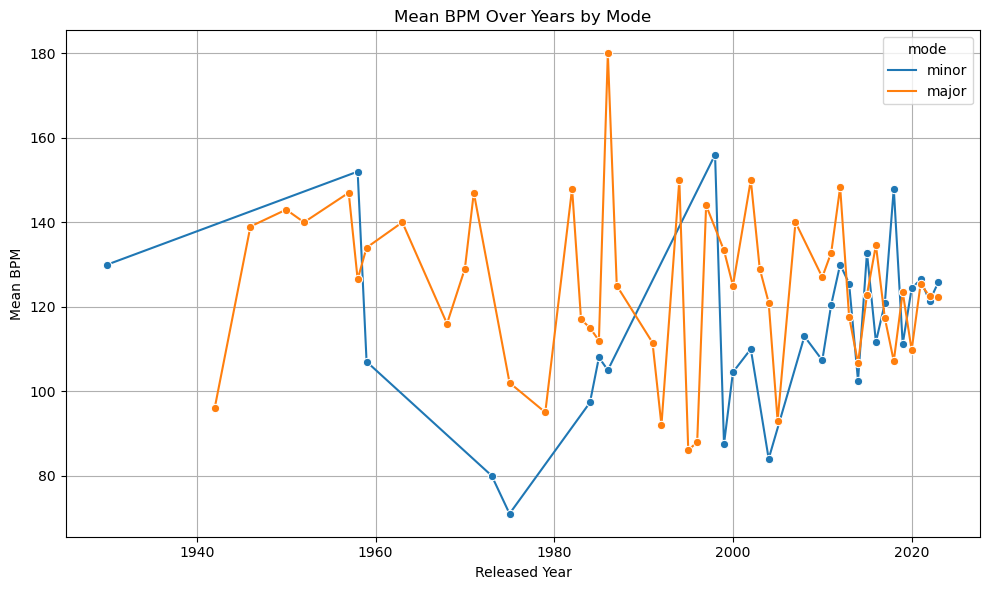

In [103]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_bpm_per_year_mode = df.groupby(['released_year', 'mode'])['bpm'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_bpm_per_year_mode, x='released_year', y='bpm', hue='mode', marker='o')

plt.title('Mean BPM Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean BPM')
plt.grid(True)
plt.tight_layout()
plt.show()

### Danceability Trends Over Time

The `danceability_%` metric assesses how suitable a track is for dancing. By analyzing its average over the years, we gain insights into the rhythmic patterns and grooves preferred in music. This trend reflects the evolving dance culture and how music has adapted to cater to or shape dancefloor dynamics.

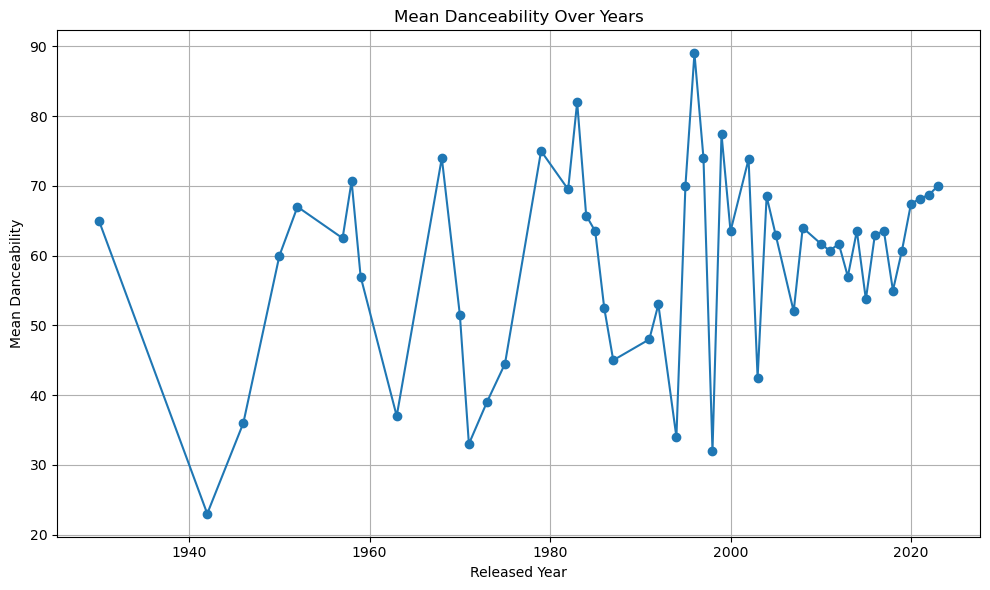

In [104]:
# Group by 'released_year' and calculate the mean for 'streams'
mean_dance_per_year = df.groupby('released_year')['danceability_%'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_dance_per_year.plot(kind='line', marker='o')
plt.title('Mean Danceability Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Danceability')
plt.grid(True)
plt.tight_layout()
plt.show()

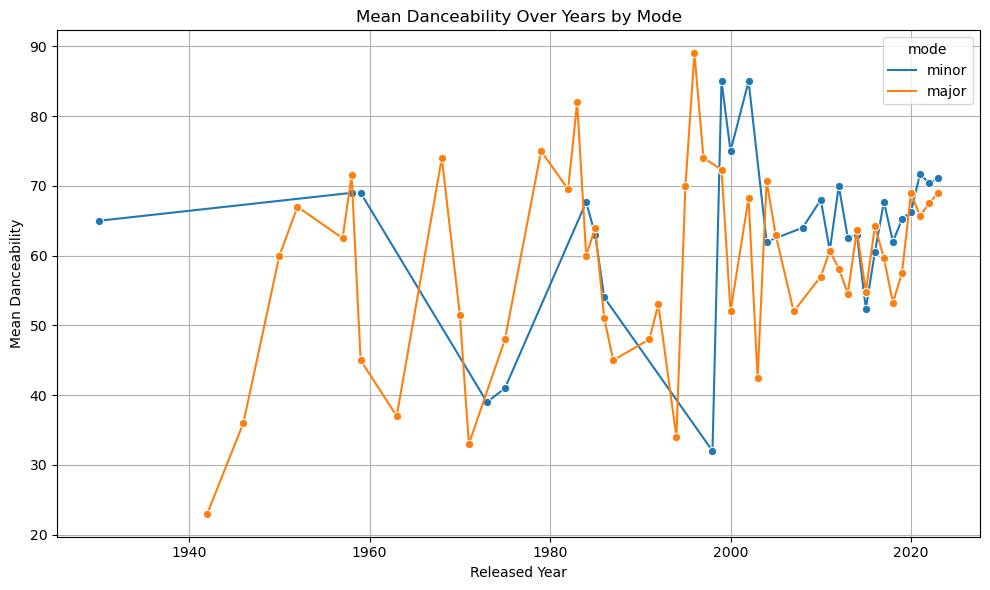

In [105]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_dan_per_year_mode = df.groupby(['released_year', 'mode'])['danceability_%'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_dan_per_year_mode, x='released_year', y='danceability_%', hue='mode', marker='o')

plt.title('Mean Danceability Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Danceability')
plt.grid(True)
plt.tight_layout()
plt.show()

### Valence Trends Over Time

The `valence_%` metric portrays the musical positiveness or mood of a track. Observing its average across years provides a glimpse into the evolving emotional tone of music. The fluctuations in this metric can indicate periods when music leaned towards more cheerful or more melancholic themes.

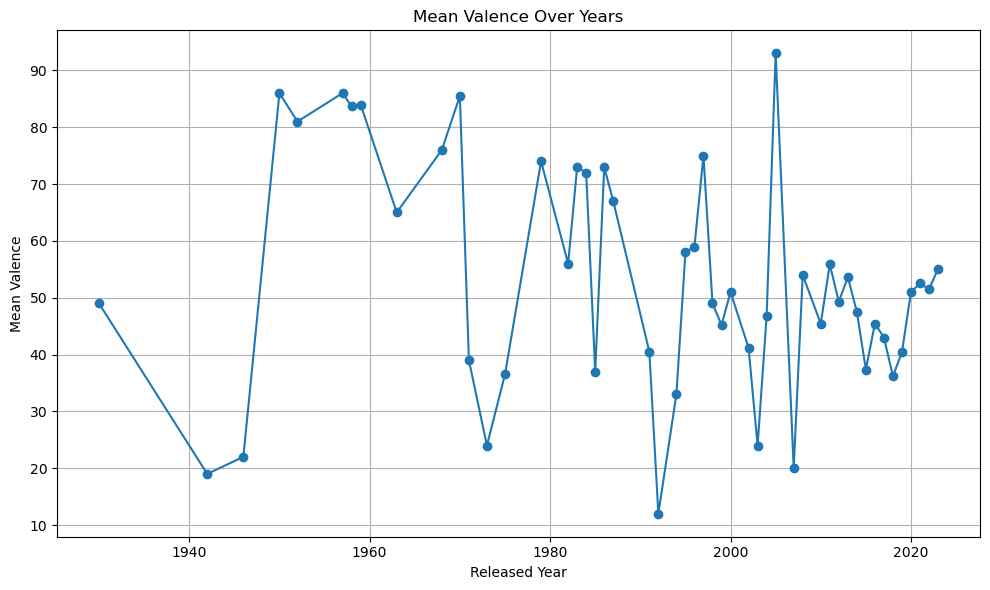

In [106]:
# Group by 'released_year' and calculate the mean for 'streams'
mean_val_per_year = df.groupby('released_year')['valence_%'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_val_per_year.plot(kind='line', marker='o')
plt.title('Mean Valence Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Valence')
plt.grid(True)
plt.tight_layout()
plt.show()

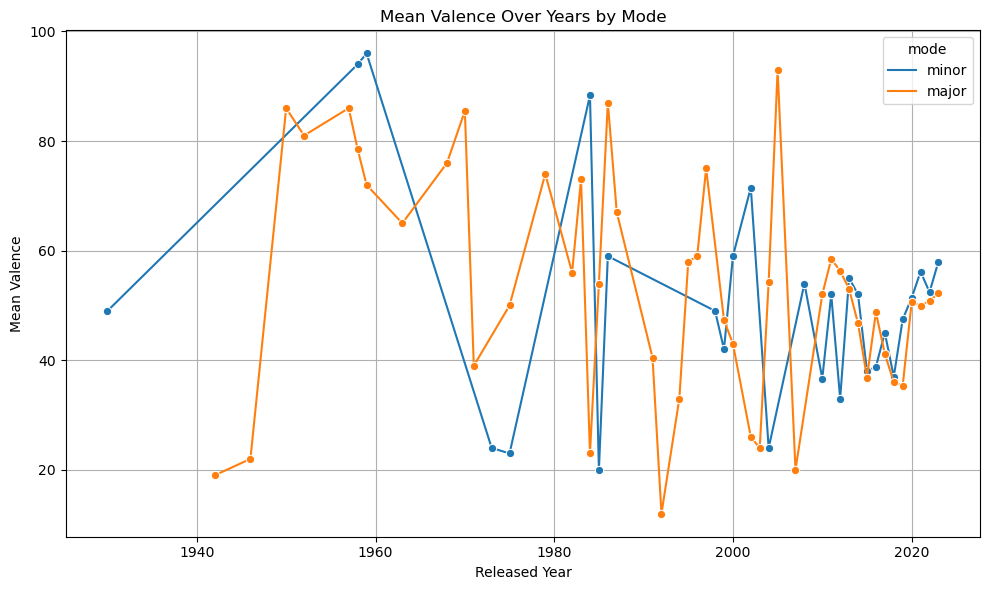

In [107]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_val_per_year_mode = df.groupby(['released_year', 'mode'])['valence_%'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_val_per_year_mode, x='released_year', y='valence_%', hue='mode', marker='o')

plt.title('Mean Valence Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Valence')
plt.grid(True)
plt.tight_layout()
plt.show()

### Energy Trends Over Time

The `energy_%` metric captures the intensity and dynamism of a track. Monitoring its mean value across the years reveals insights into the changing energy levels and intensity of music. This trend indicates the shifts in musical tastes, possibly leaning towards more upbeat or more subdued compositions over time.

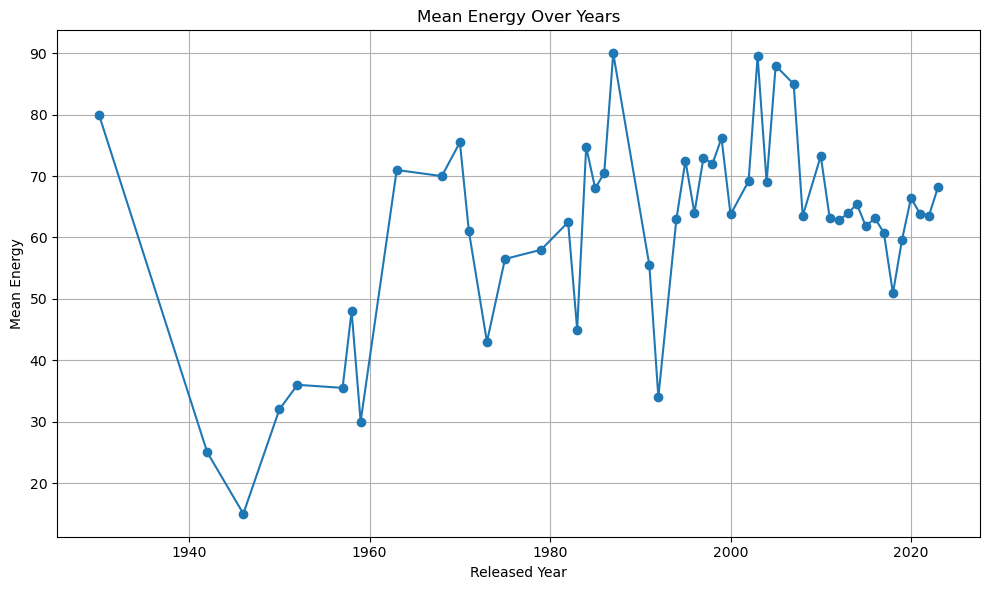

In [108]:
# Group by 'released_year' and calculate the mean for 'energy'
mean_en_per_year = df.groupby('released_year')['energy_%'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_en_per_year.plot(kind='line', marker='o')
plt.title('Mean Energy Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Energy')
plt.grid(True)
plt.tight_layout()
plt.show()

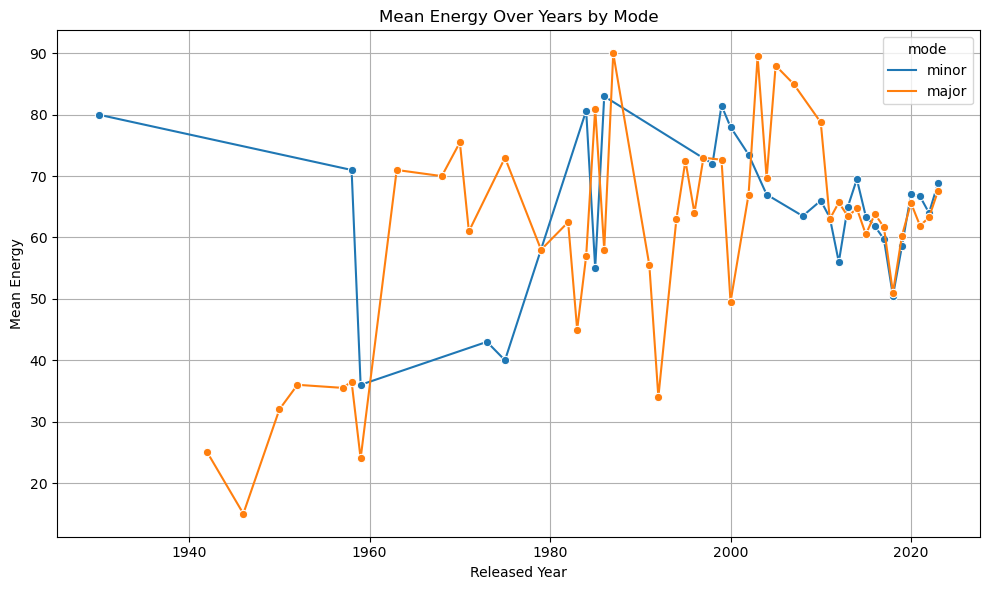

In [109]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_en_per_year_mode = df.groupby(['released_year', 'mode'])['energy_%'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_en_per_year_mode, x='released_year', y='energy_%', hue='mode', marker='o')

plt.title('Mean Energy Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Energy')
plt.grid(True)
plt.tight_layout()
plt.show()

### Acousticness Trends Over Time

The `acousticness_%` metric gauges how acoustic a track is, as opposed to electronic. Analyzing its average over the years sheds light on the shifting balance between acoustic and electronic production in music. It offers a perspective on the evolving preferences and technological influences in the music industry.

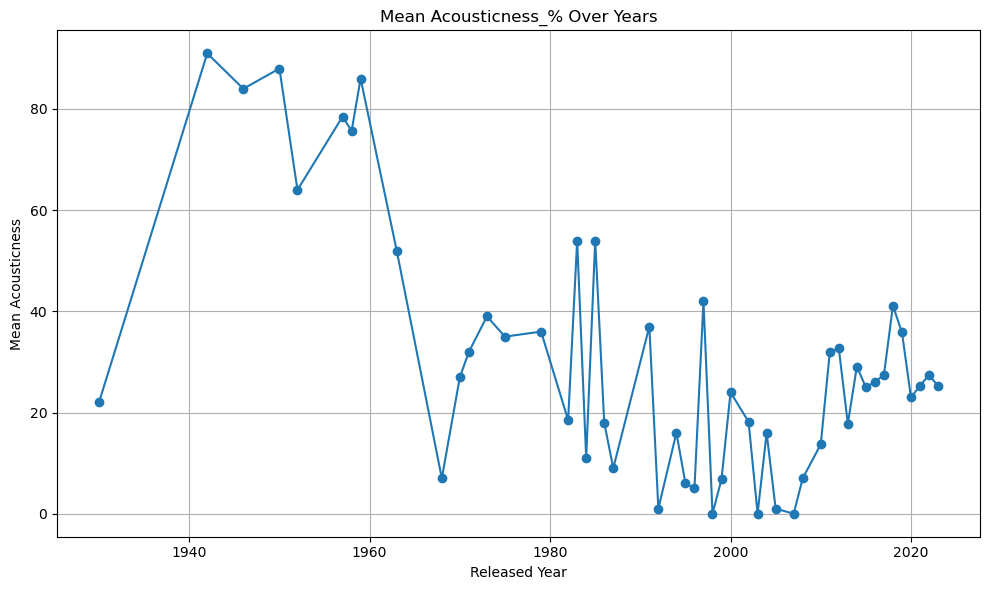

In [110]:
# Group by 'released_year' and calculate the mean for 'streams'
mean_aq_per_year = df.groupby('released_year')['acousticness_%'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_aq_per_year.plot(kind='line', marker='o')
plt.title('Mean Acousticness_% Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Acousticness')
plt.grid(True)
plt.tight_layout()
plt.show()

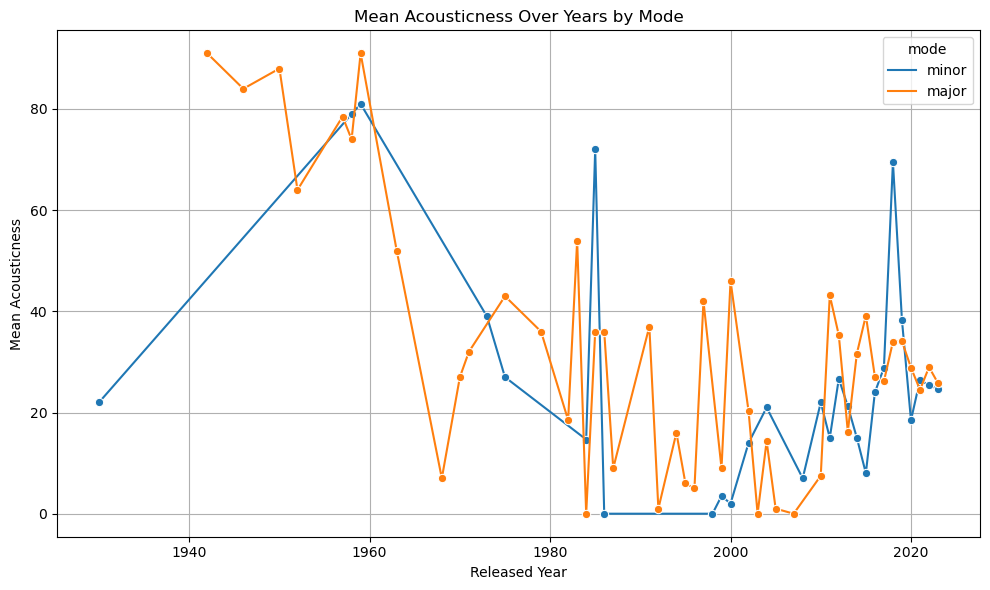

In [111]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_aq_per_year_mode = df.groupby(['released_year', 'mode'])['acousticness_%'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_aq_per_year_mode, x='released_year', y='acousticness_%', hue='mode', marker='o')

plt.title('Mean Acousticness Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Acousticness')
plt.grid(True)
plt.tight_layout()
plt.show()

### Instrumentalness Trends Over Time

The `instrumentalness_%` metric quantifies the proportion of a track that is instrumental. Tracking its mean over the years provides insights into the balance between instrumental and vocal content in music. This evolution might reflect shifts in musical preferences, from tracks dominated by instruments to those highlighting vocals, or vice versa.

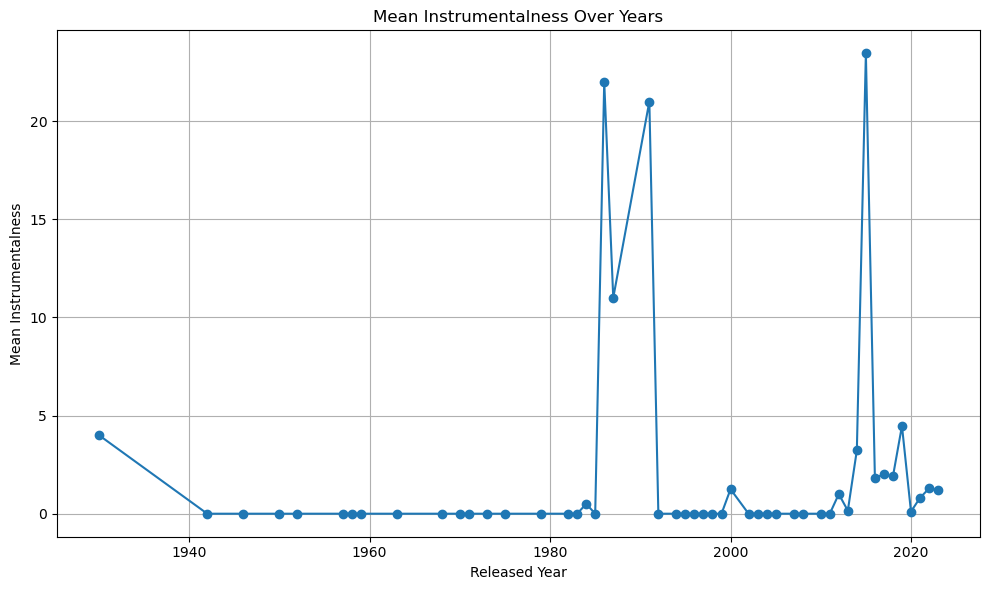

In [112]:
# Group by 'released_year' and calculate the mean for 'streams'
mean_ints_per_year = df.groupby('released_year')['instrumentalness_%'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_ints_per_year.plot(kind='line', marker='o')
plt.title('Mean Instrumentalness Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Instrumentalness')
plt.grid(True)
plt.tight_layout()
plt.show()

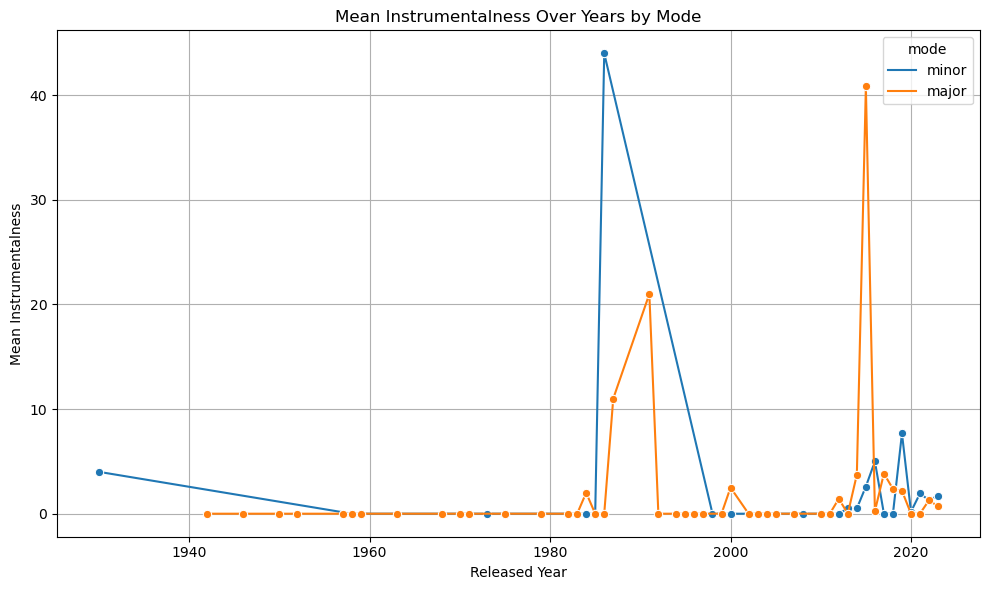

In [113]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_int_per_year_mode = df.groupby(['released_year', 'mode'])['instrumentalness_%'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_int_per_year_mode, x='released_year', y='instrumentalness_%', hue='mode', marker='o')

plt.title('Mean Instrumentalness Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Instrumentalness')
plt.grid(True)
plt.tight_layout()
plt.show()

### Liveness Trends Over Time

The `liveness_%` metric measures the detection of a live audience in tracks, hinting at the track's "live performance" nature. Observing its average value over the years provides insights into the prevalence of live recordings versus studio productions in music. The shifts in this metric can reflect changing industry preferences or technological advances in live recording quality.

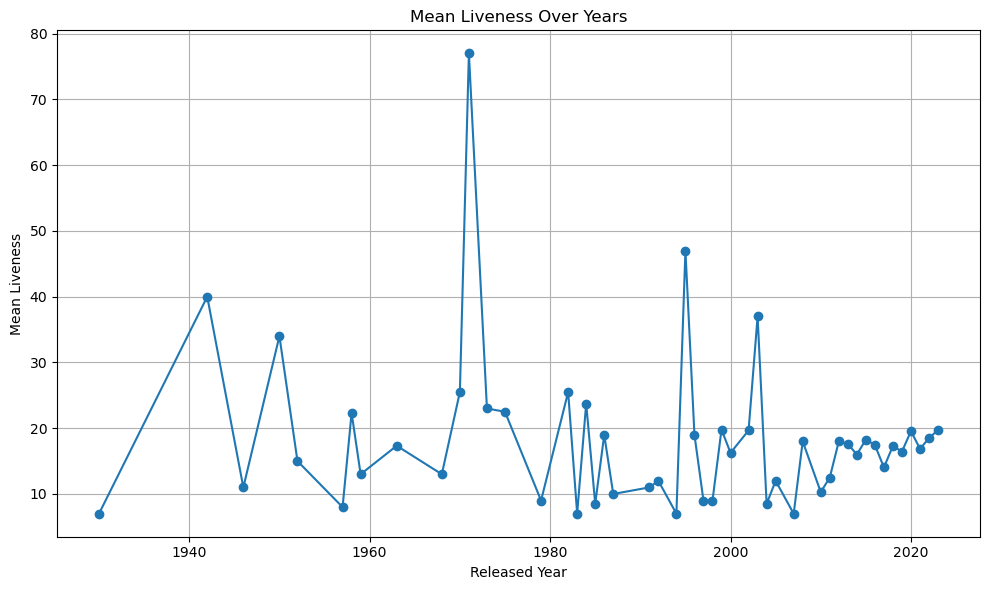

In [114]:
# Group by 'released_year' and calculate the mean for 'streams'
mean_liv_per_year = df.groupby('released_year')['liveness_%'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_liv_per_year.plot(kind='line', marker='o')
plt.title('Mean Liveness Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Liveness')
plt.grid(True)
plt.tight_layout()
plt.show()

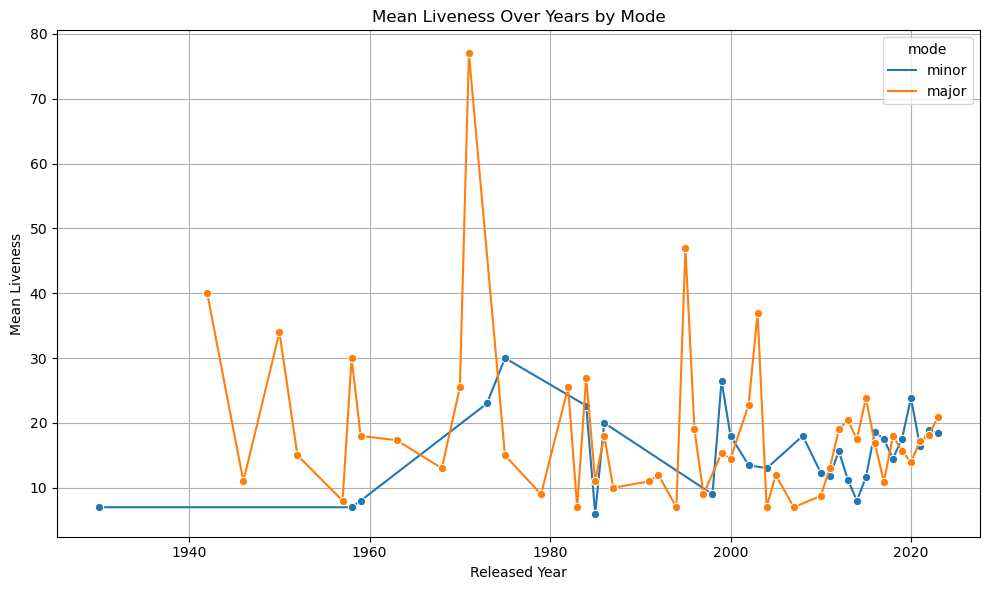

In [115]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_liv_per_year_mode = df.groupby(['released_year', 'mode'])['liveness_%'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_liv_per_year_mode, x='released_year', y='liveness_%', hue='mode', marker='o')

plt.title('Mean Liveness Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Liveness')
plt.grid(True)
plt.tight_layout()
plt.show()

### Speechiness Over Time

The `speechiness_%` metric captures the presence of spoken words in a track. By analyzing its mean value over the years, we can observe the changing trends in lyrical composition and the prominence of speech-like sounds in music. This offers insights into evolving music styles and the integration of spoken content in tracks across decades.

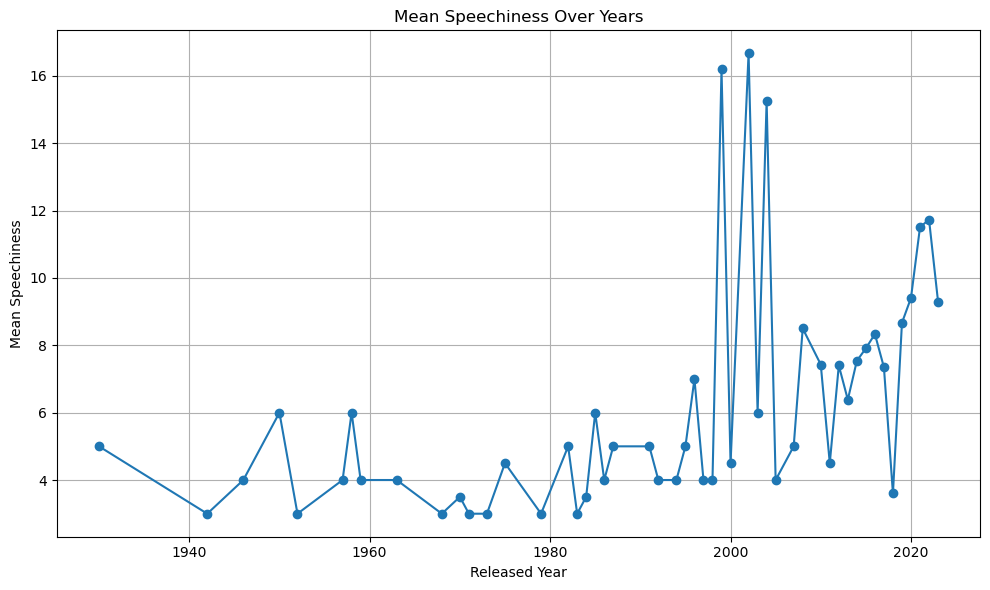

In [116]:
# Group by 'released_year' and calculate the mean for 'streams'
mean_sps_per_year = df.groupby('released_year')['speechiness_%'].mean()

# Plot
plt.figure(figsize=(10, 6))
mean_sps_per_year.plot(kind='line', marker='o')
plt.title('Mean Speechiness Over Years')
plt.xlabel('Released Year')
plt.ylabel('Mean Speechiness')
plt.grid(True)
plt.tight_layout()
plt.show()

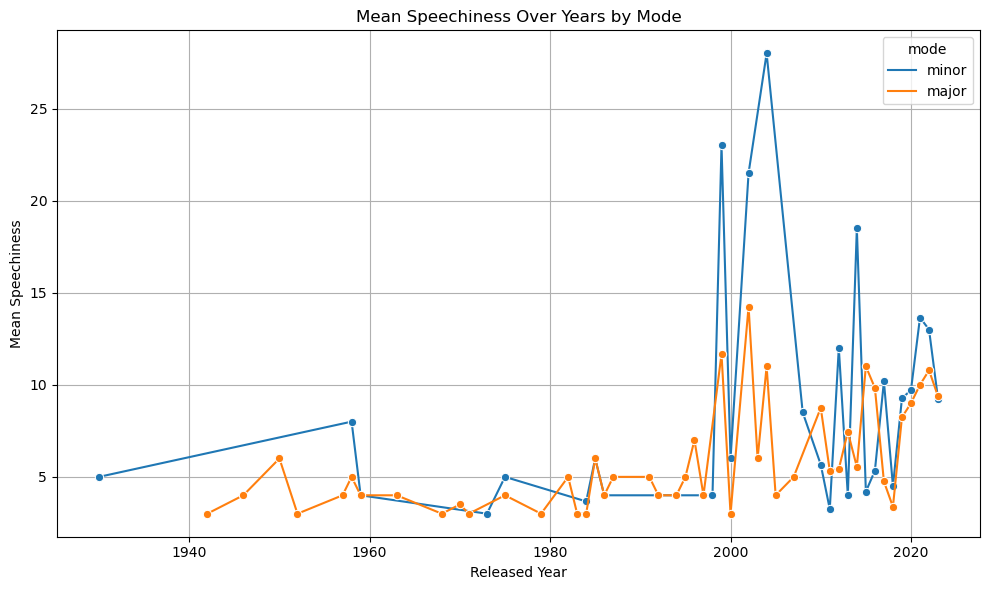

In [117]:
# Group by 'released_year' and 'mode', then compute mean 'bpm'
mean_spm_per_year_mode = df.groupby(['released_year', 'mode'])['speechiness_%'].mean().reset_index()

plt.figure(figsize=(10, 6))

# Use seaborn's lineplot to plot with hue for 'mode'
sns.lineplot(data=mean_spm_per_year_mode, x='released_year', y='speechiness_%', hue='mode', marker='o')

plt.title('Mean Speechiness Over Years by Mode')
plt.xlabel('Released Year')
plt.ylabel('Mean Speechiness')
plt.grid(True)
plt.tight_layout()
plt.show()

## Correlation Matrix

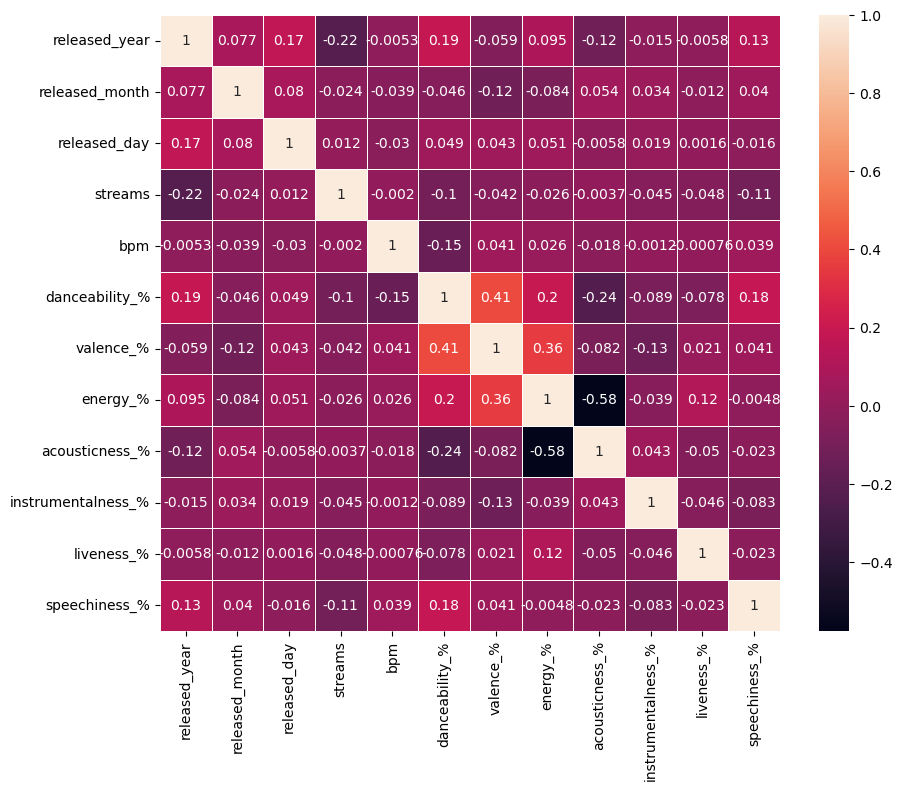

In [118]:
all_data = ['released_year', 'released_month', 'released_day',  'streams',
       'bpm', 'danceability_%', 'valence_%', 'energy_%', 'mode',
       'acousticness_%', 'instrumentalness_%', 'liveness_%', 'speechiness_%']

dat_var = df[all_data]

# Set the size of the figure
plt.figure(figsize=(10, 8))
sns.heatmap(dat_var.corr(),  linewidths=.5,  annot=True)

plt.show()

### Correlation Analysis

In our correlation matrix, we identified several noteworthy relationships between musical attributes:

- **Valence and Danceability**: A correlation of `0.41` suggests a moderate positive relationship. Tracks with higher valence (indicating a happier sound) tend to be more danceable.
  
- **Energy and Valence**: The correlation value of `0.36` indicates a mild positive association. Songs that sound more energetic or intense generally have a more positive or cheerful tone.
  
- **Acousticness and Energy**: A significant negative correlation of `-0.58` denotes that tracks with higher acousticness (meaning they sound more organic or natural) are typically less energetic.
  
- **Acousticness and Danceability**: A correlation of `0.2` represents a weak positive relationship, suggesting that as a track's acousticness rises, it may become slightly more danceable, though the effect is not strong.

- **Streams and Released Year**: The correlation of `-0.22` suggests a weak negative relationship. This implies that, on average, songs released more recently might have slightly fewer streams compared to older songs. It's worth noting that factors like the availability duration of older songs could influence this observation.

These correlations provide insights into the interplay of different musical attributes and how they influence each other.


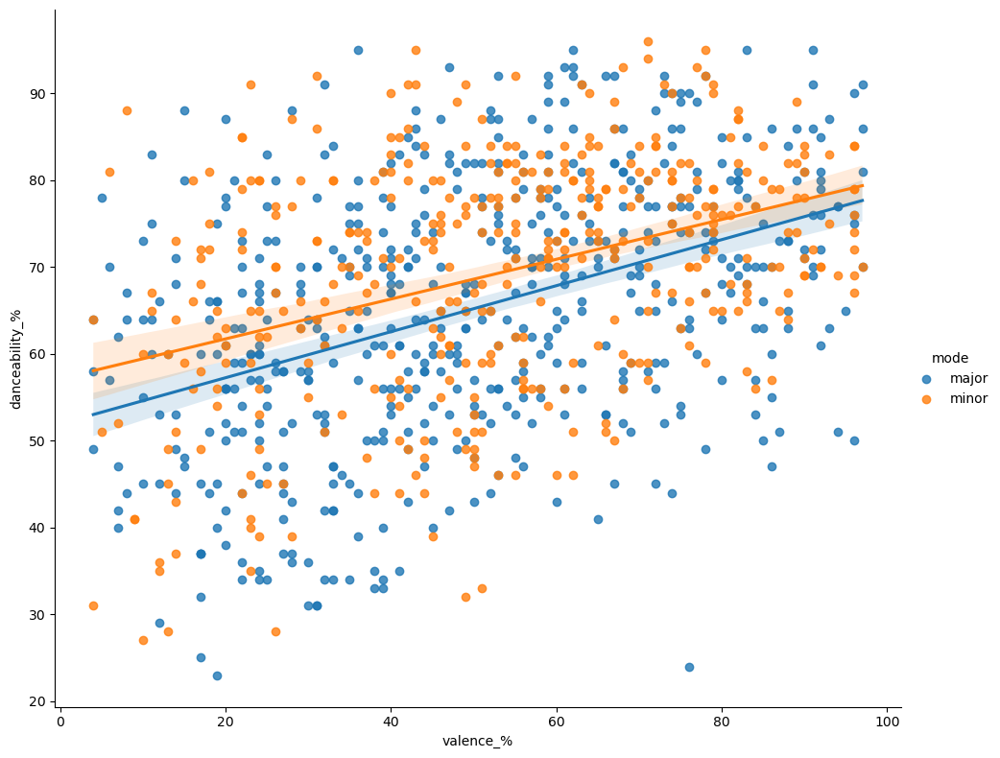

In [119]:
# Plot with larger dimensions
sns.lmplot(data=df, x="valence_%", y="danceability_%", hue="mode", height=8, aspect=1.2)

# Show the plot
plt.show()

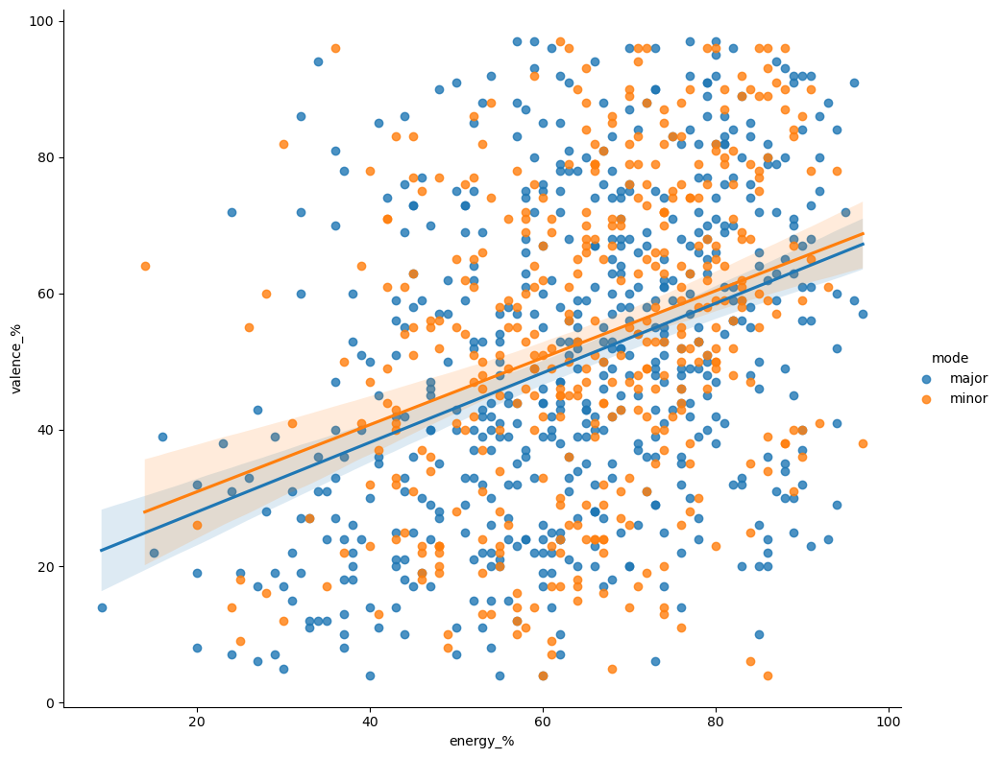

In [120]:
# Plot with larger dimensions
sns.lmplot(data=df, x="energy_%", y="valence_%", hue="mode", height=8, aspect=1.2)

# Show the plot
plt.show()

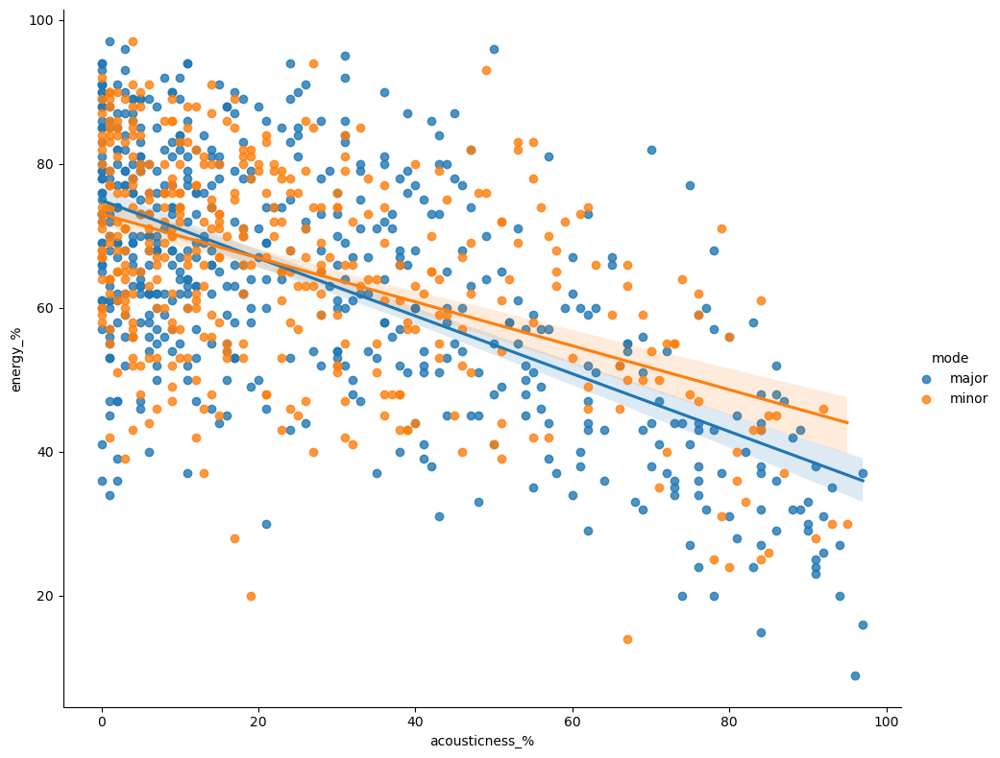

In [121]:
# Plot with larger dimensions
sns.lmplot(data=df, x="acousticness_%", y="energy_%", hue="mode", height=8, aspect=1.2)

# Show the plot
plt.show()

### Data Pairplot with Mode variable

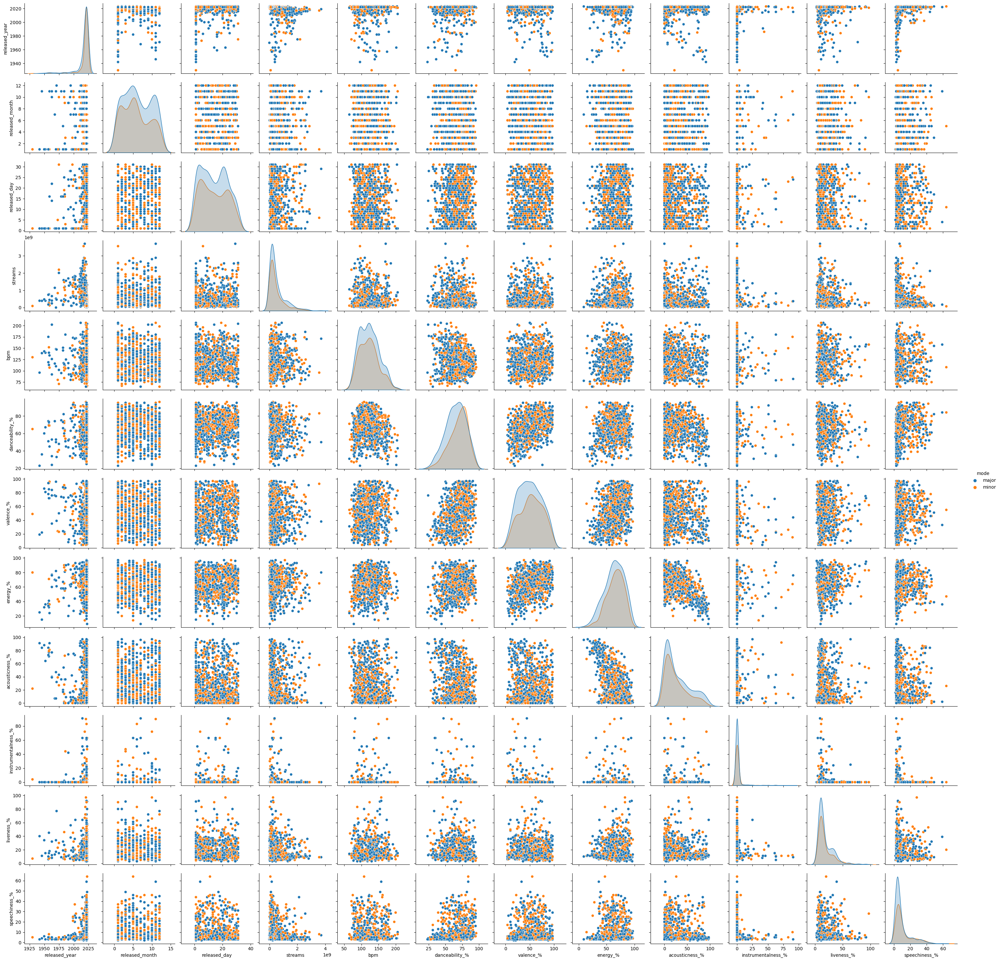

In [122]:
sns.pairplot(dat_var, hue = 'mode')

# Next

---

## Data Preprocessing

Before diving into machine learning, we must ensure our data is primed for optimal results. Here's an outline of our preprocessing approach:

### 1. **Feature Selection**: 
   - Choose significant features to avoid overfitting and expedite model computations. Approaches like Recursive Feature Elimination (RFE) and tree-based feature ranking can be employed.

### 2. **Dummy Data Conversion**: 
   - Convert categorical variables to a numerical form, often through "One Hot Encoding".

### 3. **Scaling**: 
   - Standardize data to ensure algorithms, especially those sensitive to feature scales, perform optimally. Common techniques are Min-Max Scaling and Standard Scaling.

### 4. **Data Splitting**: 
   - Segment the dataset into training and testing sets, ensuring a good spread of data for both model training and evaluation.

### **Note**: 
   - In our analysis, the `mode` serves as the independent variable, which influences our preprocessing decisions.

These steps streamline our dataset, paving the way for effective and accurate machine learning outcomes.

---

In [123]:
df.columns
# Drop columns

Index(['track_name', 'artist(s)_name', 'artist_count', 'released_year',
       'released_month', 'released_day', 'in_spotify_playlists',
       'in_spotify_charts', 'streams', 'in_apple_playlists', 'in_apple_charts',
       'in_deezer_playlists', 'in_deezer_charts', 'in_shazam_charts', 'bpm',
       'key', 'mode', 'danceability_%', 'valence_%', 'energy_%',
       'acousticness_%', 'instrumentalness_%', 'liveness_%', 'speechiness_%',
       'track_type', 'artist_Rank', 'track_Rank'],
      dtype='object')

In [124]:
df = df.drop(['track_type', 'released_year', 'released_month', 'released_day', 'track_name', 'artist(s)_name', 'artist_count', 'artist_Rank', 'track_Rank', 'in_apple_playlists', 'in_apple_charts', 'in_deezer_playlists', 'in_deezer_charts', 'in_shazam_charts', 'in_spotify_charts', 'in_spotify_playlists'], axis=1)

In [125]:
df.columns

Index(['streams', 'bpm', 'key', 'mode', 'danceability_%', 'valence_%',
       'energy_%', 'acousticness_%', 'instrumentalness_%', 'liveness_%',
       'speechiness_%'],
      dtype='object')

In [126]:
print('Dataset::')
df.head()

Dataset::


,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,141381703,125,b,major,80,89,83,31,0,8,4
1,133716286,92,c#,major,71,61,74,7,0,10,4
2,140003974,138,f,major,51,32,53,17,0,31,6
3,800840817,170,a,major,55,58,72,11,0,11,15
4,303236322,144,a,minor,65,23,80,14,63,11,6


In [127]:
X = df.drop('mode', axis=1).values
y = df['mode'].values

In [128]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)

# Transform dependent variable to Binary using LabelEncoder

In [129]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [2])], remainder = 'passthrough')
X = np.array(ct.fit_transform(X))

# To transform categoric data into numeric data or USe pd.get_dummies

In [130]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state= 0)

In [131]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test =  sc.transform(X_test)

In [132]:
X_test2 = X_test.copy()
y_test2 = y_test.copy()
X_train2 = X_test.copy()
y_train2 = y_train.copy()

---

## Overview of the Classification ML Model

In our pursuit of data-driven insights, our ambition is to recognize patterns that allow us to predict categorical outcomes accurately. This document offers a comprehensive overview of the strategies and techniques we employ to develop our classification models:

### 1. **Logistic Regression**

A cornerstone in the realm of classification, **Logistic Regression** excels particularly in situations that require binary classification. It is adept at estimating the likelihood that a given instance falls within a default category.

**GridSearchCV for Logistic Regression** provides an efficient mechanism for model optimization:
```python
param_grid = {
    'C': np.logspace(-4, 4, 20),
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}
```

**Confusion Matrix:** An intuitive tool, the confusion matrix offers a detailed breakdown of our model's predictions into categories: true positives, false positives, true negatives, and false negatives. This granularity provides insights into the specific areas where our model might falter.

### 2. **Precision-Recall Dynamics**

The **Precision-Recall Curve** stands out as a critical tool that captures the balance between precision and recall over a range of decision thresholds. This is particularly vital in scenarios with class imbalances, with a higher curve area indicating a harmonious blend of recall and precision.

### 3. **Stacking Approach**

By harnessing an ensemble of diverse models, we aim to create a more robust predictor. Our strategy leverages:

- **Logistic Regression** for its adeptness at estimating probabilities.
- **SVM** for its flexibility in capturing intricate, non-linear relationships.
- **Decision Tree Classifier** to provide clear decision boundaries based on feature significance.

### 4. **The ROC Curve**

The **Receiver Operating Characteristic (ROC) Curve** stands as a testament to a binary classifier's performance over varying thresholds. A plot of the True Positive Rate against the False Positive Rate, a pronounced Area Under the Curve (AUC) points to a model with superior discernment abilities.

### 5. **K-fold Cross Validation**

To guarantee our model's resilience and versatility, it's imperative to assess its performance across diverse data sets. **K-fold Cross Validation** achieves this by fractioning the data into 'k' segments. Training is conducted on `k-1` segments, while the remaining serves as the test bed. This cycle iterates until each segment has been a test set once, providing an aggregate measure of the model's prowess.

With this rich arsenal of techniques, our objective stands clear: to craft a classification model that is both versatile and reliable.

---

### Feature Importance: 
###### Leveraging Logistic Regression

In our mission to create a sophisticated model, it's pivotal to identify which features significantly influence outcomes. Using Logistic Regression, we can quantify the impact of each feature, ensuring that our model is both efficient and interpretable.

---

In [133]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(max_iter=10000)  # increased max_iter for convergence
log_reg.fit(X_train, y_train)

# Feature importance from coefficients
logistic_importance = log_reg.coef_[0]

# Displaying the importance
for i, v in enumerate(logistic_importance):
    print('Feature: %0d, Score: %.5f' % (i, v))

Feature: 0, Score: 0.06458
Feature: 1, Score: 0.11216
Feature: 2, Score: 0.14495
Feature: 3, Score: -0.21170
Feature: 4, Score: -0.31468
Feature: 5, Score: 0.20414
Feature: 6, Score: 0.36489
Feature: 7, Score: 0.08815
Feature: 8, Score: 0.18232
Feature: 9, Score: -0.19560
Feature: 10, Score: -0.15096
Feature: 11, Score: -0.11685
Feature: 12, Score: 0.05033
Feature: 13, Score: 0.30657
Feature: 14, Score: 0.02968
Feature: 15, Score: -0.01409
Feature: 16, Score: -0.14958
Feature: 17, Score: 0.02107
Feature: 18, Score: 0.07874
Feature: 19, Score: 0.16086


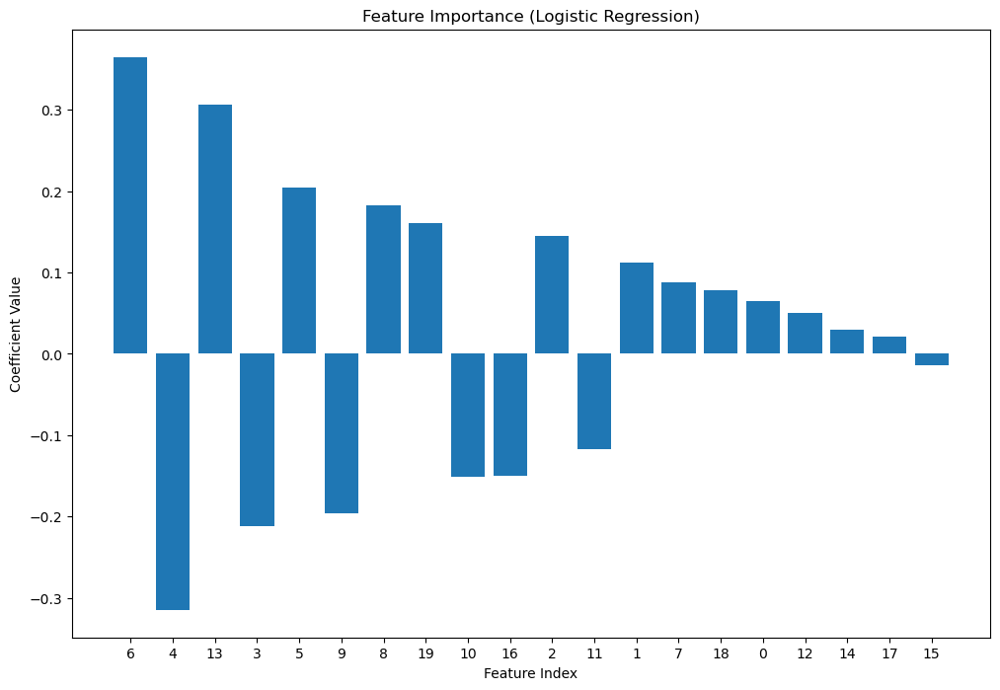

In [134]:
# Sort feature importances in descending order and get the indices
indices = np.argsort(np.abs(logistic_importance))[::-1]

plt.figure(figsize=(12, 8))
plt.title('Feature Importance (Logistic Regression)')
plt.bar(range(X_train.shape[1]), logistic_importance[indices], align='center')
plt.xticks(range(X_train.shape[1]), indices)
plt.xlabel('Feature Index')
plt.ylabel('Coefficient Value')
plt.show()

---

## Grid Search Optimization for Classification

With GridSearchCV, we've meticulously honed our Logistic Regression model by navigating through various hyperparameters:

**Parameter Exploration**:
- **C**: Denotes the inverse of regularization strength, exploring a log scale from \(10^{-4}\) to \(10^{4}\).
- **Penalty**: Choices include 'l1' (Lasso) or 'l2' (Ridge).
- **Solver**: 'liblinear', tailored for smaller datasets.

Following this optimization, our `best_model` was determined, representing the prime set of hyperparameters.

**Performance Metrics**:
- **Accuracy**: A score of 64.02% reveals the proportion of correctly identified observations.
- **Precision**: At 57.78%, this marks our model's precision in identifying true positives accurately.
- **Recall**: A measure of 52% showcases the model's capability to detect all actual positives.
- **F1 Score**: Standing at 54.74%, it delivers a balanced measure, blending both precision and recall for a holistic view.

This suite of metrics presents a concise depiction of the prowess of our refined Logistic Regression model.

---

In [135]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [136]:
param_grid = {
    'C': np.logspace(-4, 4, 20), # You can adjust the range and number of values based on your understanding of the data
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear'] # 'liblinear' supports both 'l1' and 'l2' penalties
}

In [137]:
log_reg = LogisticRegression()
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='f1') # Using f1-score as the scoring metric. You can change this depending on your objective.

In [138]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'penalty': ['l1', 'l2'], 'solver': ['liblinear']},
             scoring='f1')

In [139]:
best_model = grid_search.best_estimator_
y_pred_lg = best_model.predict(X_test)

The accuracy of the Logistic Regression: 64.01673640167364


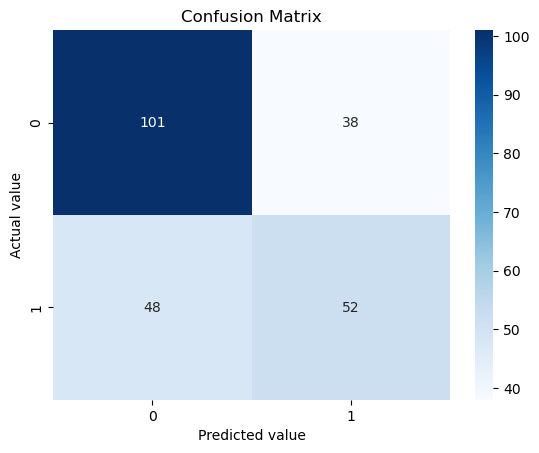

In [140]:
from sklearn.metrics import confusion_matrix,  precision_recall_curve, accuracy_score, recall_score, precision_score, f1_score

accuracy_lg = accuracy_score(y_test, y_pred_lg)*100
precision_lg = precision_score(y_test, y_pred_lg)*100
score_lg = f1_score(y_test, y_pred_lg)*100
recall_lg = recall_score(y_test, y_pred_lg)*100

print('The accuracy of the Logistic Regression:', accuracy_lg)
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_lg)

# Get the string format of each number without scientific notation
annot_labels = np.array([["{:,}".format(val) for val in row] for row in cm])

# Create a heatmap of the confusion matrix using seaborn
sns.heatmap(cm, annot=annot_labels, cmap="Blues", fmt="")

# Set labels and title
plt.xlabel("Predicted value")
plt.ylabel("Actual value")
plt.title("Confusion Matrix")

# Show the plot
plt.show()

#### Independent variable: Mode feature

* **Major: 0**
* **Minor: 1**

### Logistic Regression: Precision-Recall curve

In [141]:
y_scores = best_model.decision_function(X_test)
precision, recall, thresholds = precision_recall_curve(y_test, y_scores)

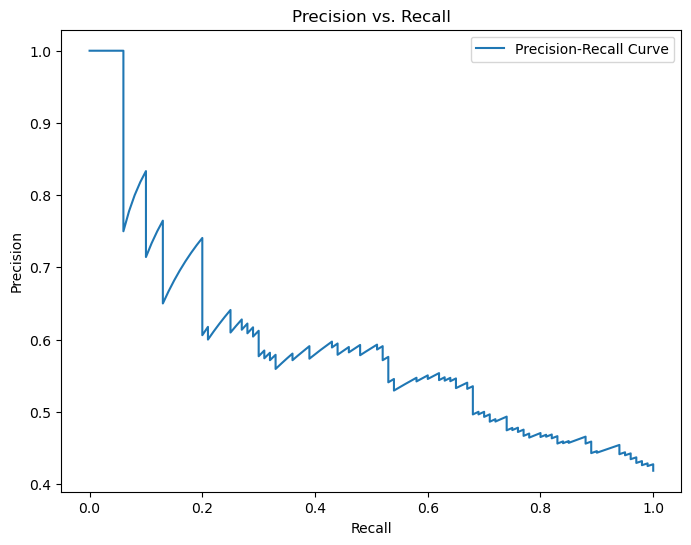

In [142]:
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label="Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision vs. Recall")
plt.legend()
plt.show()

---

## Stacked Model Performance Metrics

After implementing our ensemble strategy, here's a concise summary of how the model performed:

- **Model**: The stacked model uses Logistic Regression as the meta-learner to combine predictions.
- **Accuracy**: Achieved an accuracy score of 62.76%. This means our model correctly predicted the outcome around 63% of the time.
- **Precision**: With a score of 56.79%, this metric highlights the model's capability to correctly identify positive instances from those it labeled positive.
- **Recall**: Our model has a recall of 46%. This tells us that out of all the actual positive instances, the model identified 46% of them correctly.
- **F1 Score**: At 50.83%, the F1 score provides a balanced measure between precision and recall.

Using these metrics, we can better gauge the proficiency of our stacked ensemble model.

---

In [143]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

# Base estimators
base_learners = [
                 ('rf_1', DecisionTreeClassifier()),
                 ('rf_2', SVC())             
                ]

# Meta model
logreg = LogisticRegression()

# Stacking classifier
stack_clf = StackingClassifier(estimators=base_learners, final_estimator=logreg)

stack_clf.fit(X_train, y_train)
y_pred_stack = stack_clf.predict(X_test)

# calculate accuracy, precision, recall and f1_score
accuracy_stack = accuracy_score(y_test, y_pred_stack)*100
precision_stack = precision_score(y_test, y_pred_stack)*100
score_stack = f1_score(y_test, y_pred_stack)*100
recall_stack = recall_score(y_test, y_pred_stack)*100

In [144]:
final = pd.DataFrame()
final["Acctuate"] = y_test
final["CV Predicted"] = y_pred_lg
final["Stack Predicted"] = y_pred_stack

### Stacking Model Evaluation (Receiver Operating Characteristic Curve)

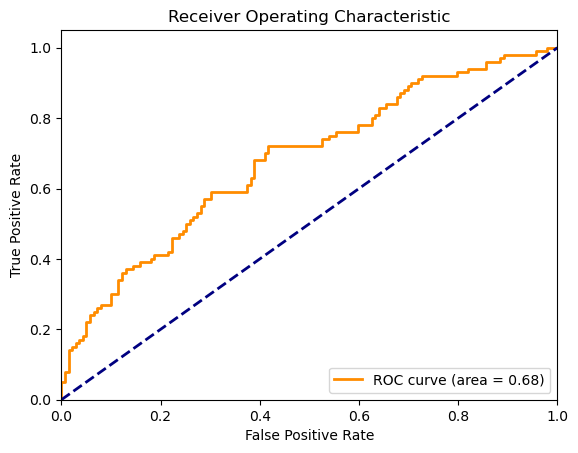

In [145]:
from sklearn.metrics import roc_curve, auc

# Fit the model on the training data
stack_clf.fit(X_train, y_train)

# Predict the probabilities of the positive class
y_prob = stack_clf.predict_proba(X_test)[:, 1]

# Compute ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [146]:
# Define the model names and accuracy values
model_names = ['Logistic Regression CV', 'Stack: Logistic Regression']
accuracy_values = [accuracy_lg, accuracy_stack]
precision_values = [precision_lg, precision_stack]
f1_score_values = [score_lg, score_stack]
recall_values = [recall_lg, recall_stack]

# Create a dictionary with the data
data = {'Model': model_names,
        'Accuracy': accuracy_values,
        'Precision': precision_values,
        'Recall': recall_values,
        'f1_score': f1_score_values}

# Create the DataFrame
df = pd.DataFrame(data)

In [147]:
df

,Model,Accuracy,Precision,Recall,f1_score
0,Logistic Regression CV,64.016736,57.777778,52.0,54.736842
1,Stack: Logistic Regression,62.761506,56.790123,46.0,50.828729


#### Accutate vs Predicted

#### Independent variable: Mode feature

* **Major: 0**
* **Minor: 1**

In [148]:
final.head(20)

,Acctuate,CV Predicted,Stack Predicted
0,0,1,0
1,0,0,0
2,0,0,0
3,0,0,1
4,0,0,1
5,1,0,1
6,0,1,1
7,1,0,0
8,1,0,0
9,0,1,1


---

## K-Fold Cross Validation Insights

Utilizing K-Fold Cross Validation, we subjected our model to a rigorous evaluation, ensuring its performance wasn't solely contingent on a single data split. This methodology divides the dataset into multiple partitions or "folds," iteratively training the model on different subsets and validating on the remaining fold.

Results from this method are promising:

- **Accuracy**: Our model exhibited an average accuracy of 64.71% across all the folds. This suggests that in most scenarios, the model is able to correctly predict around 65% of the instances.
  
- **Standard Deviation**: The standard deviation of 3.33% implies that the results across different folds were fairly consistent, with variations within this range.

These metrics provide confidence in the model's stability and reliability, ensuring it's not overly tuned to just one sample of the data.

---

In [149]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = stack_clf, X = X_train, y = y_train, cv = 10) 
print("Accuracy: {:.2f} %".format(accuracies.mean()*100))
print("Standard Deviation: {:.2f} %".format(accuracies.std()*100))

Accuracy: 64.71 %
Standard Deviation: 3.33 %


### KNN: GridSearch

In [150]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, roc_auc_score, auc

In [151]:
param_grid = {
    'n_neighbors': list(range(1, 31)),  # considering 1 to 30 neighbors
    'metric': ['euclidean', 'manhattan', 'minkowski']  # common distance metrics
}

In [152]:
knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='roc_auc')  # Using AUC as the scoring metric

In [153]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30]},
             scoring='roc_auc')

In [154]:
# Get the best model from grid search and predict both class labels and probabilities
best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)  # class predictions
y_probs = best_model.predict_proba(X_test)[:, 1]  # probabilities for the positive outcome

In [155]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

Accuracy: 0.6359832635983264
Recall: 0.49
Precision: 0.5764705882352941
F1 Score: 0.5297297297297296


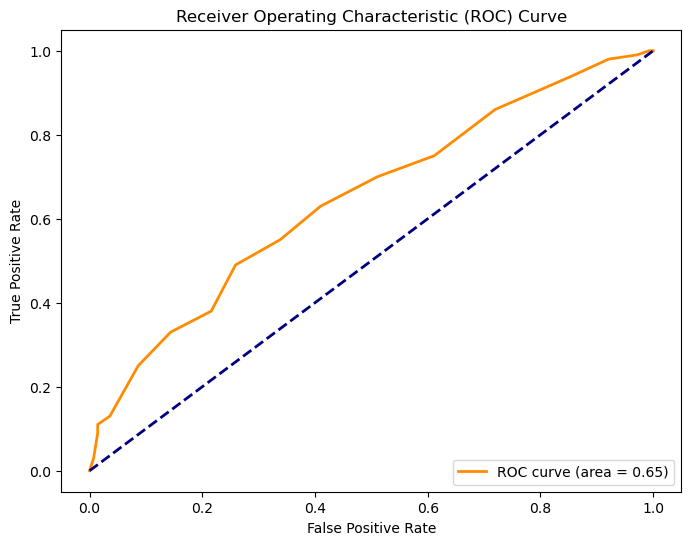

In [156]:
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [157]:
# Choose another independent variable: i.e. 'key'
# advance classification model
# feature importance in model 
# prediction and evaluation

# X_test2 
# y_test2 
# X_train2
# y_train2 